# Time Sequence Prediction



## 1. Introducing Recurrent Neural Networks [[1]](http://www.wildml.com/2015/09/recurrent-neural-networks-tutorial-part-1-introduction-to-rnns/)


The idea behind RNNs is to make use of sequential information. In a traditional neural network we assume that all inputs (and outputs) are independent of each other. But for many tasks that’s a very bad idea. If you want to predict the next word in a sentence you better know which words came before it. RNNs are called recurrent because they perform the same task for every element of a sequence, with the output being depended on the previous computations. Another way to think about RNNs is that they have a “memory” which captures information about what has been calculated so far. In theory RNNs can make use of information in arbitrarily long sequences, but in practice they are limited to looking back only a few steps (more on this later). Here is what a typical RNN looks like:

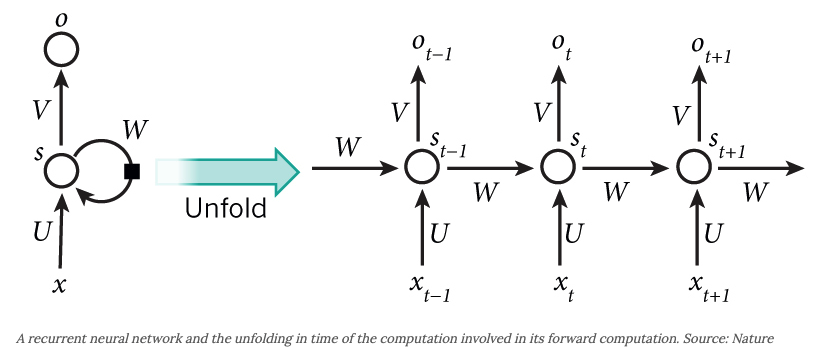


The unit cell of an RNN

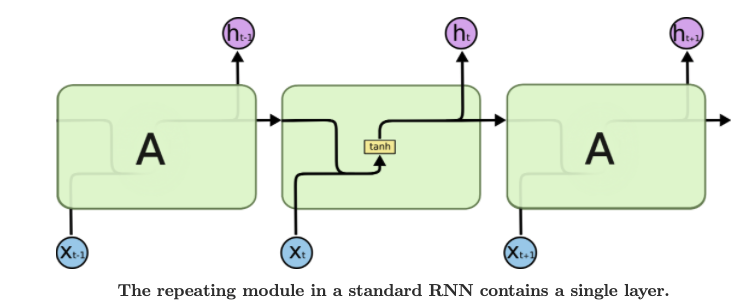

## 2. Introducing Long Short-Term Memory Units [[2]](https://colah.github.io/posts/2015-08-Understanding-LSTMs/)


Long Short Term Memory networks – usually just called “LSTMs” – are a special kind of RNN, capable of learning long-term dependencies. They were introduced by Hochreiter & Schmidhuber (1997), and were refined and popularized by many people in following work.1 They work tremendously well on a large variety of problems, and are now widely used.

LSTMs are explicitly designed to avoid the long-term dependency problem. Remembering information for long periods of time is practically their default behavior, not something they struggle to learn!

All recurrent neural networks have the form of a chain of repeating modules of neural network. In standard RNNs, this repeating module will have a very simple structure, such as a single tanh layer. Following is the basic unit of a LSTM network.

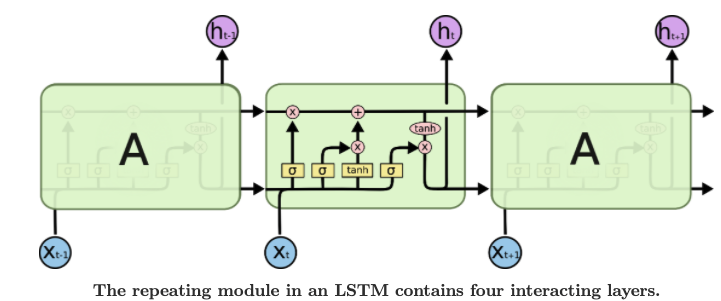

#### Why Use Tanh rather than sigmoid?

RNN's have to deal with both Vanishing and Exploding gradients. Sigmoid functions are prone to vanishing gradients and Relu are prone to exploding gradients. Tanh maybe able to balance the two extremes well.

LSTM original paper link
https://www.researchgate.net/publication/13853244_Long_Short-term_Memory


## 3. Example: Predicting Time Sequence Data

Code Author: [Pytorch Examples [3] ](https://github.com/pytorch/examples/tree/master/time_sequence_prediction)

This is a toy example to learn time sequence prediction. Two Recurrent Cell units are used in this example to learn some sine wave signals starting at different phases. After learning the sine waves, the network tries to predict the signal values in the future.


Introducing the problem


In [1]:
from __future__ import print_function
import numpy as np
import torch
import matplotlib.pyplot as plt

np.random.seed(2)

device = 'cpu'

T = 20
L = 1000
N = 100

#generate a dataset of N sine waves with randomized phase difference between them.
x = np.empty((N, L), 'int64')
x[:] = np.array(range(L)) + np.random.randint(-4 * T, 4 * T, N).reshape(N, 1)
data = np.sin(x / 1.0 / T).astype('float64')
torch.save(data, open('traindata.pt', 'wb'))

Dataset has 100 samples of 1000 points each
 (100, 1000)


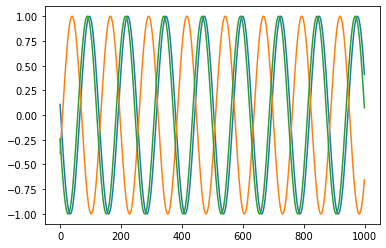

In [2]:
##visualize the dataset
%matplotlib inline

print("Dataset has 100 samples of 1000 points each\n", data.shape)

plt.plot(data[0])
plt.plot(data[1])
plt.plot(data[2])

plt.show()


### 3.1. Preparing the dataset


Identify the relevant dimensions of the dataset and 

In [3]:
import torch

#no. of test samples
test_samples = 3

# set random seed to 0
np.random.seed(0)
torch.manual_seed(0)
# load data and make training set
data = torch.load('traindata.pt')

input = torch.from_numpy(data[test_samples:, :-1])
target = torch.from_numpy(data[test_samples:, 1:])
test_input = torch.from_numpy(data[:test_samples, :-1])
test_target = torch.from_numpy(data[:test_samples, 1:])

print(input.shape, target.shape, test_input.shape, test_target.shape)

torch.Size([97, 999]) torch.Size([97, 999]) torch.Size([3, 999]) torch.Size([3, 999])


From data of size (100,1000) we initially decompose this tensor into train and test dataset. We select the first 3 sine waves for test dataset and rest sine waves for the training dataset.$$$$
Given that the output of current state is to be used to predict the output of the next state, we also create two tensors input and target sets for both training and test dataset. Note that the input and target set is almost identical. The only difference is that the last timestep is ommitted in input set and first timestep is ommitted in target set i.e. target runs 1 timestep behind the input set.

### 3.2 Defining the model (Both for LSTM and RNN)

In [4]:
import torch.nn as nn

class SequenceRNN(nn.Module):
    #model with RNN cells
    def __init__(self, device = device):
        super(SequenceRNN, self).__init__()

        self.cell = nn.RNNCell(1, 51)
        
        self.linear = nn.Linear(51, 1)

    def forward(self, input, future = 0):
        outputs = []
        h_t = torch.zeros(input.size(0), 51, dtype=torch.double, device = device)

        for input_t in input.split(1, dim=1):
            h_t = self.cell(input_t, h_t)
            output = self.linear(h_t)
            outputs += [output]

        for i in range(future):# if we should predict the future
            h_t = self.cell(output, h_t)
            output = self.linear(h_t)
            outputs += [output]

        outputs = torch.cat(outputs, dim=1)
        return outputs

class SequenceLSTM(nn.Module):
    #model with LSTM cells
    def __init__(self, device = device):
        super(SequenceLSTM, self).__init__()
        
        self.cell = nn.LSTMCell(1, 51)

        self.linear = nn.Linear(51, 1)

    def forward(self, input, future = 0):
        outputs = []
        h_t = torch.zeros(input.size(0), 51, dtype=torch.double, device = device)
        c_t = torch.zeros(input.size(0), 51, dtype=torch.double, device = device)

        for input_t in input.split(1, dim=1):
            h_t, c_t = self.cell(input_t, (h_t, c_t))
            output = self.linear(h_t)
            outputs += [output]

        for i in range(future):# if we should predict the future
            h_t, c_t = self.cell(output, (h_t, c_t))
            output = self.linear(h_t)
            outputs += [output]

        outputs = torch.cat(outputs, dim=1)
        return outputs

class SequenceLSTMstack(nn.Module):
    #model with LSTM cells
    def __init__(self, device = device):
        super(SequenceLSTMstack, self).__init__()
        
        self.cell = nn.LSTMCell(1, 51)
        self.cell2 = nn.LSTMCell(51, 51)

        self.linear = nn.Linear(51, 1)

    def forward(self, input, future = 0):
        outputs = []
        h_t = torch.zeros(input.size(0), 51, dtype=torch.double, device = device)
        c_t = torch.zeros(input.size(0), 51, dtype=torch.double, device = device)
        h_t2 = torch.zeros(input.size(0), 51, dtype=torch.double, device = device)
        c_t2 = torch.zeros(input.size(0), 51, dtype=torch.double, device = device)

        for input_t in input.split(1, dim=1):
            h_t, c_t = self.cell(input_t, (h_t, c_t))
            h_t2, c_t2 = self.cell2(h_t, (h_t2, c_t2))
            output = self.linear(h_t2)
            outputs += [output]

        for i in range(future):# if we should predict the future
            h_t, c_t = self.cell(output, (h_t, c_t))
            h_t2, c_t2 = self.cell2(h_t, (h_t2, c_t2))
            output = self.linear(h_t2)
            outputs += [output]

        outputs = torch.cat(outputs, dim=1)
        return outputs

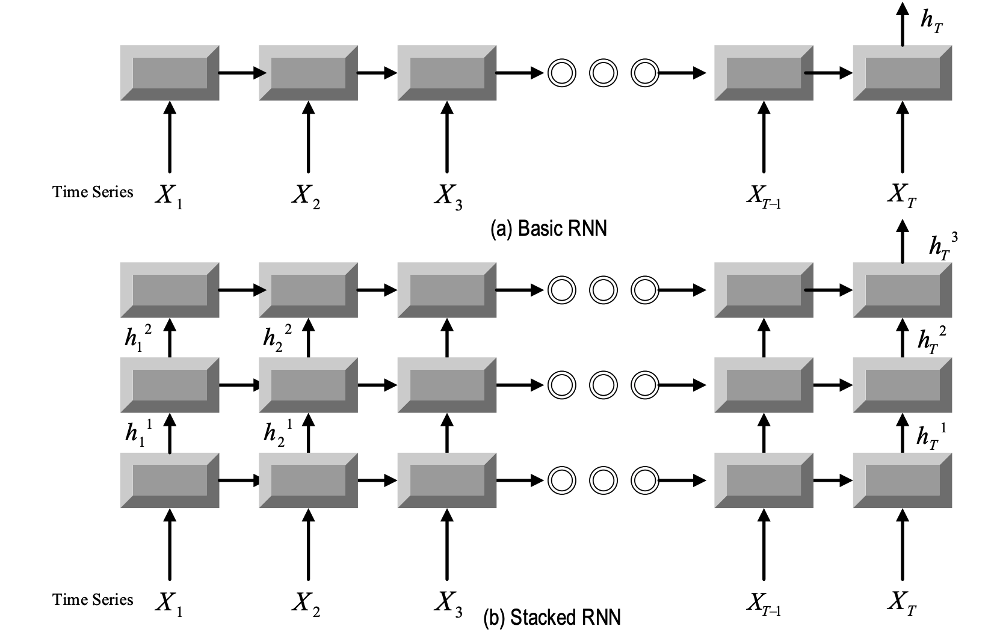

### 3.3 Training Loop and Visualization

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
import torch.optim as optim

def draw(yi, color):
        plt.plot(np.arange(input.size(1)), yi[:input.size(1)], color, linewidth = 2.0)
        plt.plot(np.arange(input.size(1), input.size(1) + future), yi[input.size(1):], color + ':', linewidth = 2.0)

def train_model(steps, seq, input, target, test_input, test_target, criterion, optimizer_type = 'Adam', device = 'cpu'):

  if optimizer_type == 'Adam':
    optimizer = optim.Adam(seq.parameters(), lr=0.01)
  elif optimizer_type == 'LBFGS':
    optimizer = optim.LBFGS(seq.parameters(), lr=0.8)

  #begin to train
  for i in range(steps):
      print('STEP: ', i)

      seq = seq.to(device)
      input = input.to(device)
      target = target.to(device)
      test_input = test_input.to(device)
      test_target = test_target.to(device)

      if optimizer_type == 'Adam':
        optimizer.zero_grad()
        out = seq(input)
        loss = criterion(out, target)
        print('loss:', loss.item())
        loss.backward()
        optimizer.step()

      elif optimizer_type == 'LBFGS':
        #for lbfgs
        def closure():
            optimizer.zero_grad()
            out = seq(input)
            loss = criterion(out, target)
            print('loss:', loss.item())
            loss.backward()
            return loss
        optimizer.step(closure)

      # begin to predict, no need to track gradient here
      with torch.no_grad():
          future = 1000
          pred = seq(test_input, future=future)
          loss = criterion(pred[:, :-future], test_target)
          print('test loss:', loss.item())
          y = pred.detach().cpu().numpy()

      # draw the result
      plot_every = 50 if optimizer_type == 'Adam' else 1

      if (i+1)%plot_every == 0:
        plt.figure(figsize=(15,5))
        plt.title('Predict future values for time sequences\n(Dashlines are predicted values)', fontsize=30)
        plt.xlabel('x', fontsize=5)
        plt.ylabel('y', fontsize=5)
        plt.xticks(fontsize=5)
        plt.yticks(fontsize=5)

        draw(y[0], 'r')
        draw(y[1], 'g')
        draw(y[2], 'b')
        # plt.savefig('predict%d.pdf'%i)
        plt.show()
        plt.close()

STEP:  0
loss: 0.6339210135877855
test loss: 0.4477605234572875
STEP:  1
loss: 0.4457804572213174
test loss: 0.2954722547942674
STEP:  2
loss: 0.2943260990012304
test loss: 0.07001705510706957
STEP:  3
loss: 0.07060372032063672
test loss: 0.749539889189094
STEP:  4
loss: 0.752141711335864
test loss: 0.04187761499298205
STEP:  5
loss: 0.043054539297434594
test loss: 0.06776132205093596
STEP:  6
loss: 0.06774001430227536
test loss: 0.1345133333626212
STEP:  7
loss: 0.13399384400471998
test loss: 0.15872927349806243
STEP:  8
loss: 0.158040507648462
test loss: 0.15641151182767535
STEP:  9
loss: 0.15571905682607404
test loss: 0.13621828707949146
STEP:  10
loss: 0.13562784031147954
test loss: 0.10201289800891218
STEP:  11
loss: 0.1016114323333499
test loss: 0.057415457182251835
STEP:  12
loss: 0.057282056073546354
test loss: 0.015592177700840091
STEP:  13
loss: 0.015763049753886045
test loss: 0.020041399995092673
STEP:  14
loss: 0.020403846514347346
test loss: 0.06505900332168735
STEP:  15
l

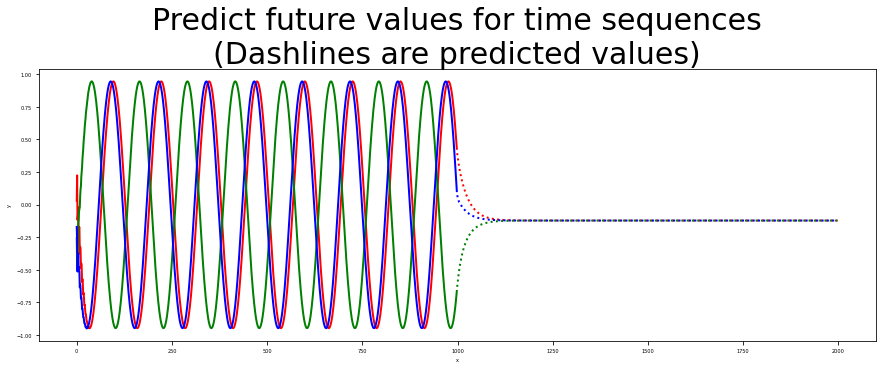

STEP:  50
loss: 0.0020033320881120463
test loss: 0.0016222582169376362
STEP:  51
loss: 0.0017735023700763896
test loss: 0.0012577246818985441
STEP:  52
loss: 0.0014144518891113498
test loss: 0.0009473038869053376
STEP:  53
loss: 0.0011105469414568097
test loss: 0.0008339044156083496
STEP:  54
loss: 0.00100303795111245
test loss: 0.0009329289954558617
STEP:  55
loss: 0.0011063123834885108
test loss: 0.0011187551096730876
STEP:  56
loss: 0.0012945740727938588
test loss: 0.0012149647210054153
STEP:  57
loss: 0.0013917495286269648
test loss: 0.001132182299871225
STEP:  58
loss: 0.001308778578515961
test loss: 0.0009312203702007836
STEP:  59
loss: 0.00110650980707392
test loss: 0.0007540077745273858
STEP:  60
loss: 0.0009268603355558594
test loss: 0.0006992417031069757
STEP:  61
loss: 0.0008688454024105463
test loss: 0.0007588086391550274
STEP:  62
loss: 0.0009251046712708661
test loss: 0.0008492206924593023
STEP:  63
loss: 0.0010130915771022438
test loss: 0.0008867157027473084
STEP:  64
lo

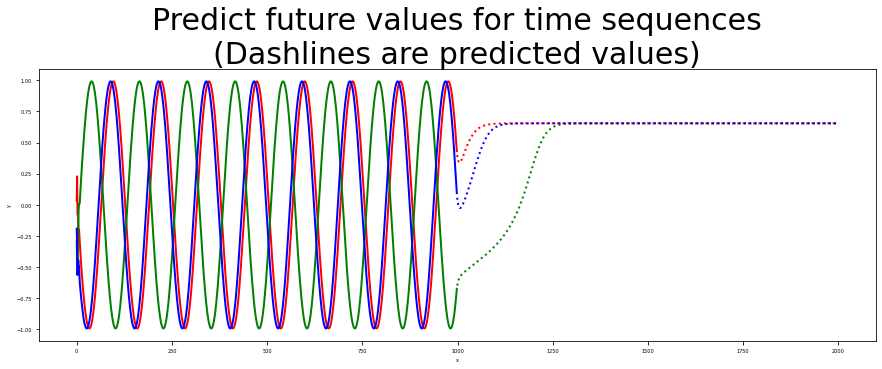

STEP:  100
loss: 0.0005193338681212292
test loss: 0.0003072566219395046
STEP:  101
loss: 0.0005164691842939183
test loss: 0.00030378379515344717
STEP:  102
loss: 0.0005136245865182136
test loss: 0.00029784811972552894
STEP:  103
loss: 0.0005087061524923991
test loss: 0.0002897593445105828
STEP:  104
loss: 0.0005020083106631108
test loss: 0.0002817203122628079
STEP:  105
loss: 0.0004956023185378203
test loss: 0.00027560716865723155
STEP:  106
loss: 0.0004911639820799153
test loss: 0.00027126729227740546
STEP:  107
loss: 0.0004883365963001308
test loss: 0.0002670072045674411
STEP:  108
loss: 0.0004852790468669045
test loss: 0.00026167466194400903
STEP:  109
loss: 0.0004807873662041451
test loss: 0.000255899435817164
STEP:  110
loss: 0.0004755458317241204
test loss: 0.0002511016159358686
STEP:  111
loss: 0.00047111425626715915
test loss: 0.00024766343702219
STEP:  112
loss: 0.00046805246012137427
test loss: 0.00024453602901199116
STEP:  113
loss: 0.00046546730744502875
test loss: 0.000240

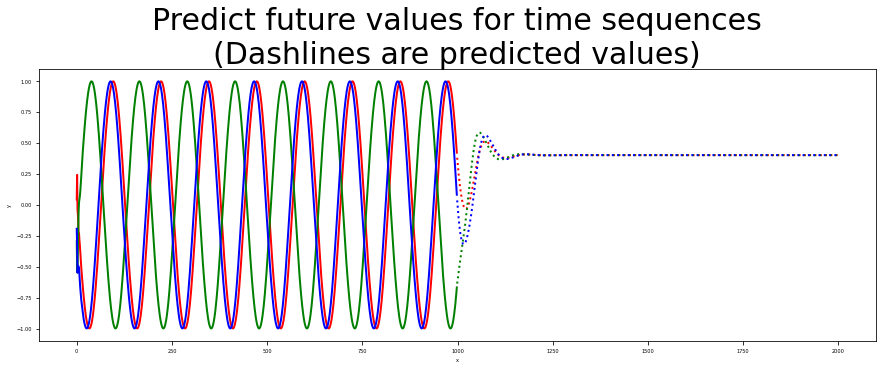

STEP:  150
loss: 0.00038541577885481165
test loss: 0.0001518508964903258
STEP:  151
loss: 0.00038393692560678667
test loss: 0.00015077416588549084
STEP:  152
loss: 0.00038248518701902435
test loss: 0.0001497405529965556
STEP:  153
loss: 0.0003810690441656933
test loss: 0.0001486998011274266
STEP:  154
loss: 0.00037966236697784754
test loss: 0.00014762541879234726
STEP:  155
loss: 0.000378245889912565
test loss: 0.00014654224177295614
STEP:  156
loss: 0.0003768337403352905
test loss: 0.00014549366895538765
STEP:  157
loss: 0.00037544674738242866
test loss: 0.00014449926885378548
STEP:  158
loss: 0.0003740802988515713
test loss: 0.00014355582641038304
STEP:  159
loss: 0.0003727155277750605
test loss: 0.0001426606173255955
STEP:  160
loss: 0.000371348736892286
test loss: 0.00014181288156139837
STEP:  161
loss: 0.00036999283728205486
test loss: 0.0001409981153429762
STEP:  162
loss: 0.0003686555674505266
test loss: 0.0001401879669187857
STEP:  163
loss: 0.00036732984269126
test loss: 0.000

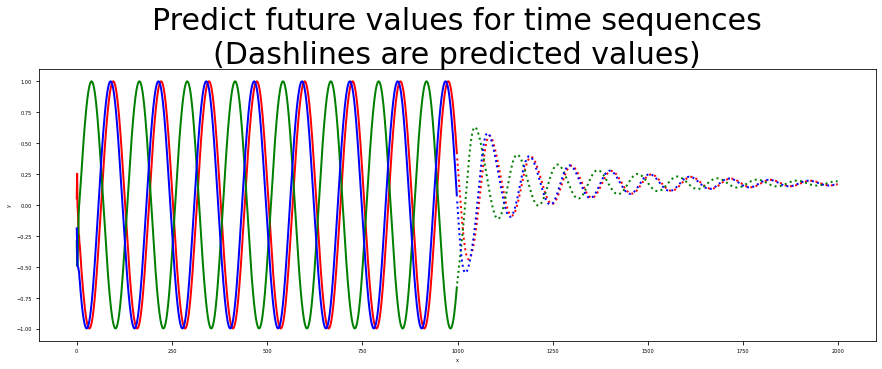

STEP:  200
loss: 0.00032405223239748707
test loss: 0.00011749023695899901
STEP:  201
loss: 0.00032303621948043514
test loss: 0.00011703485356426418
STEP:  202
loss: 0.000322027696228686
test loss: 0.0001165885323267989
STEP:  203
loss: 0.0003210263771216914
test loss: 0.00011615168593172383
STEP:  204
loss: 0.00032003207820287217
test loss: 0.00011572262203777799
STEP:  205
loss: 0.0003190448751168453
test loss: 0.0001152984190895119
STEP:  206
loss: 0.00031806482583051975
test loss: 0.00011487637291351631
STEP:  207
loss: 0.00031709177111378657
test loss: 0.00011445545277644196
STEP:  208
loss: 0.0003161255249377874
test loss: 0.00011403680751292341
STEP:  209
loss: 0.00031516608890188057
test loss: 0.00011362288567836194
STEP:  210
loss: 0.00031421350663571047
test loss: 0.00011321592793971803
STEP:  211
loss: 0.0003132676559023938
test loss: 0.00011281692045271829
STEP:  212
loss: 0.00031232836815384054
test loss: 0.00011242532263432603
STEP:  213
loss: 0.0003113956136577931
test lo

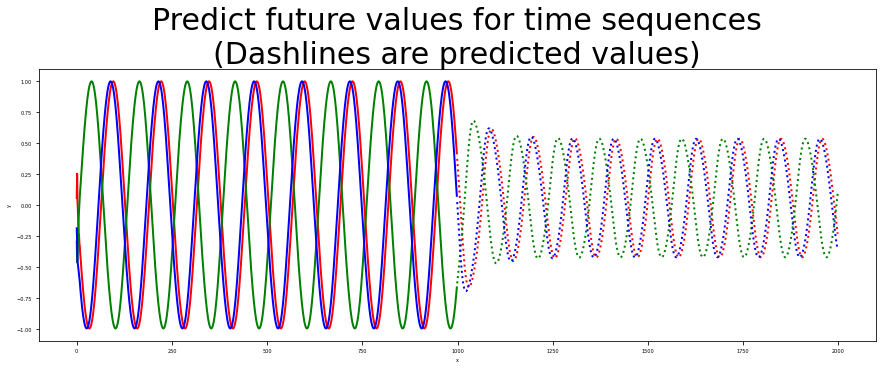

In [6]:
#main function
# ADAM & RNN
future = 1000

optimizer_type = 'Adam' #'Adam or 'LBFGS'
# optimizer_type = 'LBFGS' #'Adam or 'LBFGS'

device = 'cuda' #'cuda


# Read more about 'LBFGS' Function https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html
# limited-memory Broyden Fletcher Goldfarb Shannon (L-BFGS)

# Read the following paper to see LBFGS in action for speech recognition application:
# https://ieeexplore.ieee.org/abstract/document/8461550

#model type
seq = SequenceRNN(device = device)
# seq = SequenceLSTM(device = device)
# seq = SequenceLSTMstack(device = device)

seq.double()
criterion = nn.MSELoss()

train_model(steps = 250 if optimizer_type == 'Adam' else 15, \
            seq = seq, \
            input = input, \
            target = target, \
            test_input = test_input, \
            test_target = test_target, \
            criterion = criterion, \
            optimizer_type = optimizer_type,\
            device = device)

STEP:  0
loss: 0.5140038080821253
test loss: 0.43322948233515474
STEP:  1
loss: 0.43135480628432576
test loss: 0.34945428982709104
STEP:  2
loss: 0.34811368947678345
test loss: 0.24166734888225666
STEP:  3
loss: 0.241141582051051
test loss: 0.10239718410454582
STEP:  4
loss: 0.10340700965623312
test loss: 0.274068825762136
STEP:  5
loss: 0.28082289729947324
test loss: 0.08641796158358202
STEP:  6
loss: 0.08820741462183503
test loss: 0.06207554451198799
STEP:  7
loss: 0.06284649257038845
test loss: 0.07777285535020097
STEP:  8
loss: 0.07809956578053068
test loss: 0.08710120483734836
STEP:  9
loss: 0.08723984466938155
test loss: 0.08565458416708893
STEP:  10
loss: 0.08575947404208231
test loss: 0.07511210382561462
STEP:  11
loss: 0.07528204441501202
test loss: 0.05797977017211992
STEP:  12
loss: 0.058274886429782416
test loss: 0.0380502277773902
STEP:  13
loss: 0.03849311070735404
test loss: 0.021133174215407356
STEP:  14
loss: 0.021703623233901903
test loss: 0.013900426044624582
STEP:  

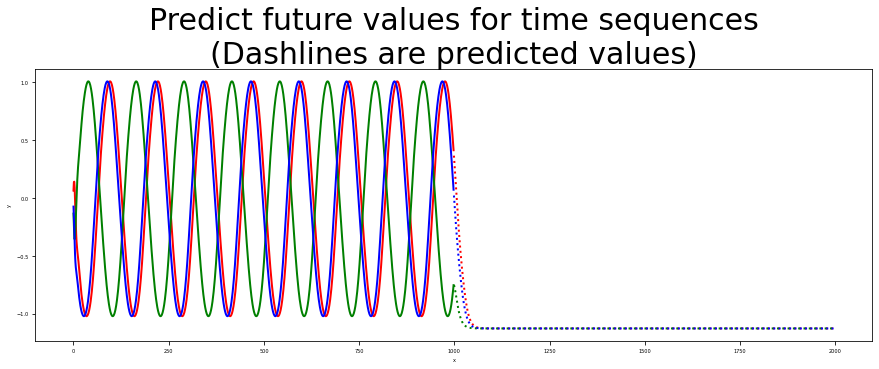

STEP:  50
loss: 0.001758959801674564
test loss: 0.0015063529147269317
STEP:  51
loss: 0.001804353510177898
test loss: 0.001297778965923891
STEP:  52
loss: 0.0015967429166737893
test loss: 0.0009734102018774318
STEP:  53
loss: 0.0012715833310963686
test loss: 0.0007240011964782401
STEP:  54
loss: 0.001020146155833427
test loss: 0.0006654413186709598
STEP:  55
loss: 0.000958911174250048
test loss: 0.0007750617825342303
STEP:  56
loss: 0.0010658402766812356
test loss: 0.0009258110676852007
STEP:  57
loss: 0.0012145048551980193
test loss: 0.0009855805677075119
STEP:  58
loss: 0.0012733415307036103
test loss: 0.0009061782846723996
STEP:  59
loss: 0.0011945102678658998
test loss: 0.0007407464185472369
STEP:  60
loss: 0.0010311758425157686
test loss: 0.0005907469582818327
STEP:  61
loss: 0.0008844112097368096
test loss: 0.0005320746041893112
STEP:  62
loss: 0.0008293617927118184
test loss: 0.0005696028665536996
STEP:  63
loss: 0.0008700004765987163
test loss: 0.0006427670260362937
STEP:  64
l

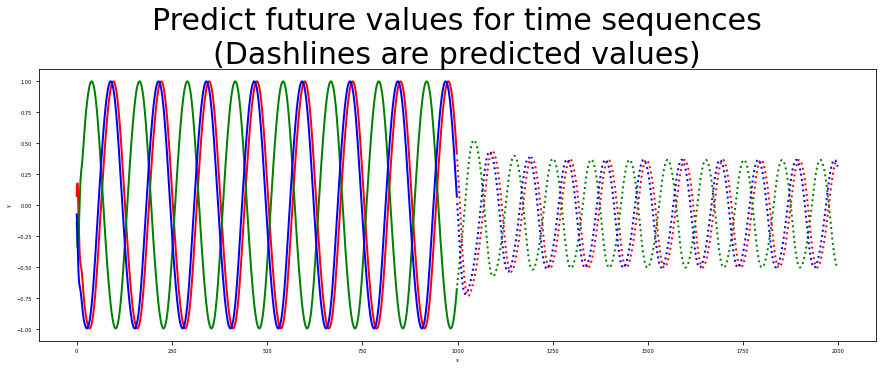

STEP:  100
loss: 0.0005444086725374509
test loss: 0.0002688901145174816
STEP:  101
loss: 0.0005432721958124519
test loss: 0.0002672331341577949
STEP:  102
loss: 0.0005422297256022839
test loss: 0.0002637574438520945
STEP:  103
loss: 0.0005389878356979183
test loss: 0.000258868291416151
STEP:  104
loss: 0.0005339669750928333
test loss: 0.00025471953954355224
STEP:  105
loss: 0.000529454702747623
test loss: 0.0002525969387562473
STEP:  106
loss: 0.0005269482713290958
test loss: 0.00025153251843102153
STEP:  107
loss: 0.0005256972425918659
test loss: 0.00024951956969854774
STEP:  108
loss: 0.0005238390598623456
test loss: 0.00024570607544907336
STEP:  109
loss: 0.000520541230239587
test loss: 0.00024109285360901354
STEP:  110
loss: 0.0005167016453602837
test loss: 0.00023723455377940882
STEP:  111
loss: 0.0005137006313724492
test loss: 0.00023462766963225378
STEP:  112
loss: 0.0005118588148573425
test loss: 0.0002324948145741677
STEP:  113
loss: 0.0005102771452622389
test loss: 0.00022992

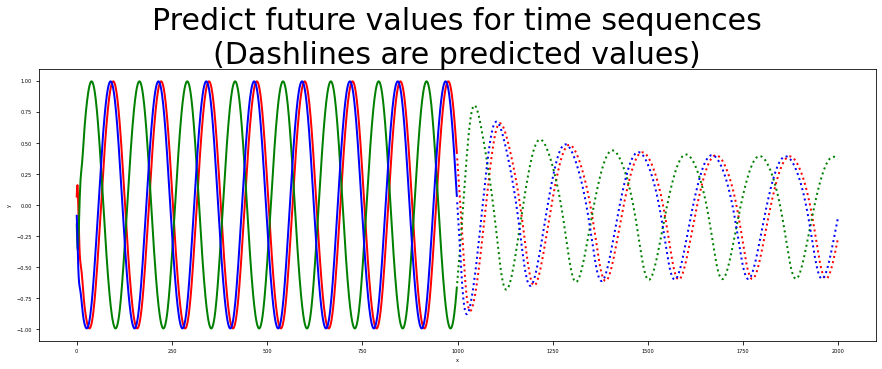

STEP:  150
loss: 0.000445405369671068
test loss: 0.00016613327754332508
STEP:  151
loss: 0.00044402868061227396
test loss: 0.00016489068506927716
STEP:  152
loss: 0.00044267401334672476
test loss: 0.00016369791001440083
STEP:  153
loss: 0.0004413501477088875
test loss: 0.00016255731809760362
STEP:  154
loss: 0.0004400369760865578
test loss: 0.00016145700726029897
STEP:  155
loss: 0.0004387169130768673
test loss: 0.00016039349255995346
STEP:  156
loss: 0.0004373972652104579
test loss: 0.0001593638672579868
STEP:  157
loss: 0.00043609562939463554
test loss: 0.00015834896281905595
STEP:  158
loss: 0.0004348139182940793
test loss: 0.00015732041005062816
STEP:  159
loss: 0.0004335378035091565
test loss: 0.00015626634582456228
STEP:  160
loss: 0.0004322585338990478
test loss: 0.0001552018040110139
STEP:  161
loss: 0.0004309835528688527
test loss: 0.0001541515503554768
STEP:  162
loss: 0.0004297228970919479
test loss: 0.00015312971911681447
STEP:  163
loss: 0.00042847444747146947
test loss: 0

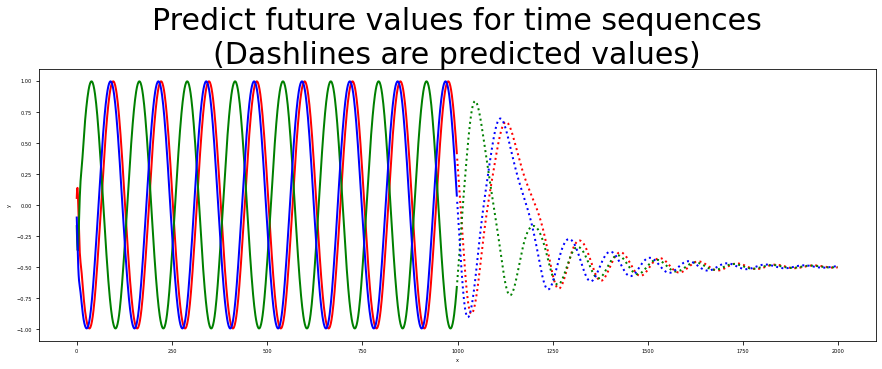

STEP:  200
loss: 0.0003856345499704437
test loss: 0.0001229466782749318
STEP:  201
loss: 0.00038456843586365193
test loss: 0.00012231014300658415
STEP:  202
loss: 0.0003835073709375824
test loss: 0.0001216809154289576
STEP:  203
loss: 0.0003824515594974526
test loss: 0.00012105625533440155
STEP:  204
loss: 0.00038140097030497103
test loss: 0.00012043424822775859
STEP:  205
loss: 0.00038035546960204917
test loss: 0.00011981496774911041
STEP:  206
loss: 0.0003793150891981685
test loss: 0.00011920034809193533
STEP:  207
loss: 0.00037827998276599394
test loss: 0.00011859288050695907
STEP:  208
loss: 0.00037725018867597066
test loss: 0.00011799418663998836
STEP:  209
loss: 0.0003762256141080182
test loss: 0.00011740432516630116
STEP:  210
loss: 0.00037520623202819364
test loss: 0.00011682196633679379
STEP:  211
loss: 0.0003741921353055746
test loss: 0.00011624518215107302
STEP:  212
loss: 0.0003731833878272598
test loss: 0.00011567246212692742
STEP:  213
loss: 0.0003721799493018008
test los

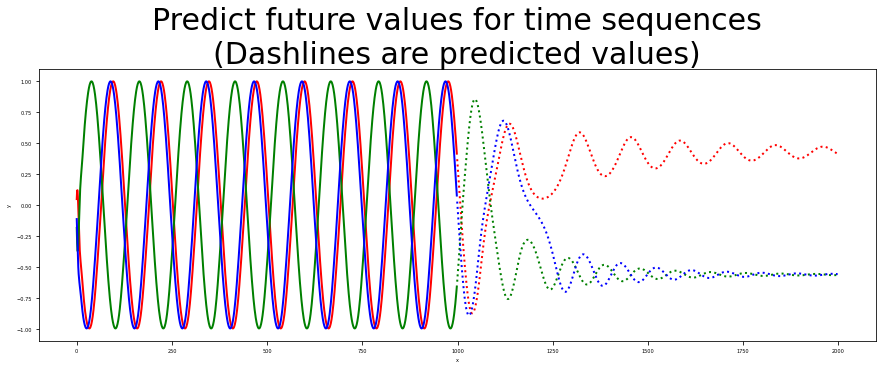

In [7]:
#main function
# ADAM & LSTM
future = 1000

optimizer_type = 'Adam' #'Adam or 'LBFGS'
# optimizer_type = 'LBFGS' #'Adam or 'LBFGS'

device = 'cuda' #'cuda


# Read more about 'LBFGS' Function https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html
# limited-memory Broyden Fletcher Goldfarb Shannon (L-BFGS)

# Read the following paper to see LBFGS in action for speech recognition application:
# https://ieeexplore.ieee.org/abstract/document/8461550

#model type
# seq = SequenceRNN(device = device)
seq = SequenceLSTM(device = device)
# seq = SequenceLSTMstack(device = device)

seq.double()
criterion = nn.MSELoss()

train_model(steps = 250 if optimizer_type == 'Adam' else 15, \
            seq = seq, \
            input = input, \
            target = target, \
            test_input = test_input, \
            test_target = test_target, \
            criterion = criterion, \
            optimizer_type = optimizer_type,\
            device = device)

STEP:  0
loss: 0.521595112956586
test loss: 0.44756953269039124
STEP:  1
loss: 0.44562840460240616
test loss: 0.3484780720814834
STEP:  2
loss: 0.3473526092495997
test loss: 0.14277072943852787
STEP:  3
loss: 0.14345948346590437
test loss: 0.31437626363702614
STEP:  4
loss: 0.3179505256940206
test loss: 0.09227020757804985
STEP:  5
loss: 0.09363337358197522
test loss: 0.08065518963126679
STEP:  6
loss: 0.08138827345421364
test loss: 0.1100413631593135
STEP:  7
loss: 0.11050153155426046
test loss: 0.1228426517328027
STEP:  8
loss: 0.1232587629838135
test loss: 0.1096160110904115
STEP:  9
loss: 0.11009132500760517
test loss: 0.07909266514560244
STEP:  10
loss: 0.07966446960234988
test loss: 0.046755225945430544
STEP:  11
loss: 0.04742636399833826
test loss: 0.028987709794343904
STEP:  12
loss: 0.02974797338725191
test loss: 0.03516000100633192
STEP:  13
loss: 0.03599210183841685
test loss: 0.052479419422133265
STEP:  14
loss: 0.05333792392590017
test loss: 0.05425957756501426
STEP:  15
l

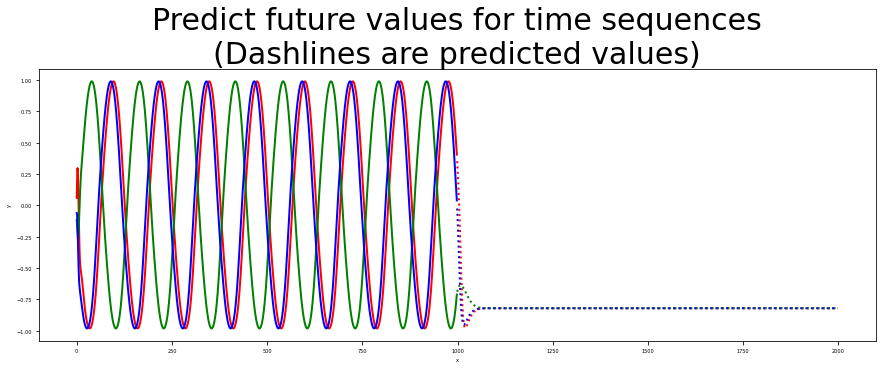

STEP:  50
loss: 0.0010879639094183617
test loss: 0.0010734725663302726
STEP:  51
loss: 0.0013960835985832266
test loss: 0.0013645328377593702
STEP:  52
loss: 0.0016833652137184178
test loss: 0.0012367185771283754
STEP:  53
loss: 0.001544139853661294
test loss: 0.0008433734207722003
STEP:  54
loss: 0.0011338283458844826
test loss: 0.0006186114469617985
STEP:  55
loss: 0.0008900364844351462
test loss: 0.0007384342649636281
STEP:  56
loss: 0.0009928598463282102
test loss: 0.0009833631616138314
STEP:  57
loss: 0.0012261063713737551
test loss: 0.0010357023462573393
STEP:  58
loss: 0.001273759087768135
test loss: 0.0008419502974479885
STEP:  59
loss: 0.001082248333690827
test loss: 0.0006250013300978504
STEP:  60
loss: 0.0008725770983456364
test loss: 0.0005948655480248617
STEP:  61
loss: 0.0008513599967421647
test loss: 0.0007215576424280042
STEP:  62
loss: 0.000985025063996264
test loss: 0.000795264778228787
STEP:  63
loss: 0.0010615104368416086
test loss: 0.0007030972232924835
STEP:  64
l

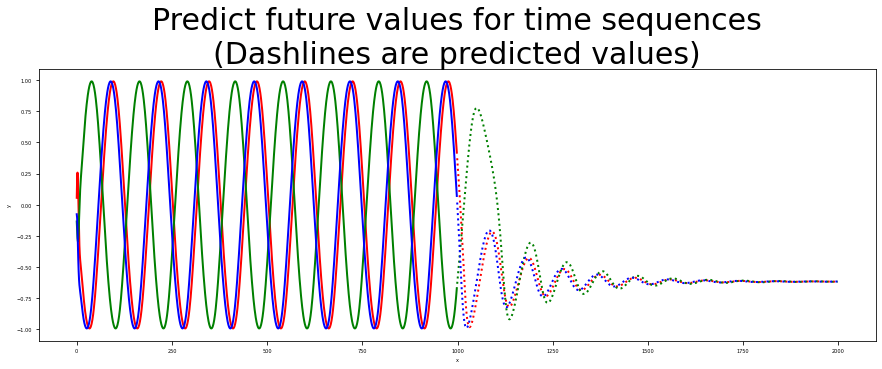

STEP:  100
loss: 0.000545030965641072
test loss: 0.00025124963158222087
STEP:  101
loss: 0.0005435762923924073
test loss: 0.00024578572866307643
STEP:  102
loss: 0.000537545522079829
test loss: 0.00024016871022997457
STEP:  103
loss: 0.0005306529760262745
test loss: 0.00023840785981323642
STEP:  104
loss: 0.0005274938476161712
test loss: 0.00023790712091656348
STEP:  105
loss: 0.000526199973180419
test loss: 0.00023394991911073086
STEP:  106
loss: 0.0005224214325437257
test loss: 0.00022725036670807801
STEP:  107
loss: 0.0005166595513452629
test loss: 0.00022198863152409469
STEP:  108
loss: 0.0005125646348550449
test loss: 0.00021914983028399574
STEP:  109
loss: 0.0005106567327855693
test loss: 0.00021600257174271111
STEP:  110
loss: 0.0005079507159283429
test loss: 0.00021159547309306816
STEP:  111
loss: 0.0005034326974662216
test loss: 0.0002080620325722236
STEP:  112
loss: 0.0004993897314821914
test loss: 0.0002062828387236911
STEP:  113
loss: 0.000497091875510801
test loss: 0.00020

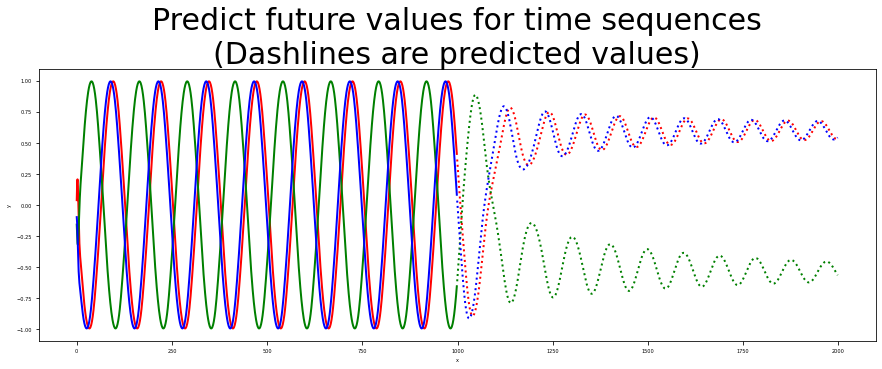

STEP:  150
loss: 0.00042465909532911274
test loss: 0.00014198414166472883
STEP:  151
loss: 0.00042333061363598857
test loss: 0.000141166158402488
STEP:  152
loss: 0.00042200938248776807
test loss: 0.0001404072617156539
STEP:  153
loss: 0.00042073622757427193
test loss: 0.0001396034637780239
STEP:  154
loss: 0.00041948032566265793
test loss: 0.00013871496744709462
STEP:  155
loss: 0.00041821194831753657
test loss: 0.0001378103051711711
STEP:  156
loss: 0.0004169592826744179
test loss: 0.00013695748845278315
STEP:  157
loss: 0.00041574205239428496
test loss: 0.0001361629107160217
STEP:  158
loss: 0.00041453259470213504
test loss: 0.00013542516518317177
STEP:  159
loss: 0.0004133188740734486
test loss: 0.00013474191683512344
STEP:  160
loss: 0.0004121244993042623
test loss: 0.0001340622011940176
STEP:  161
loss: 0.0004109542714963732
test loss: 0.000133321485255165
STEP:  162
loss: 0.0004097866627684567
test loss: 0.00013252629096262406
STEP:  163
loss: 0.00040862118402529854
test loss: 0

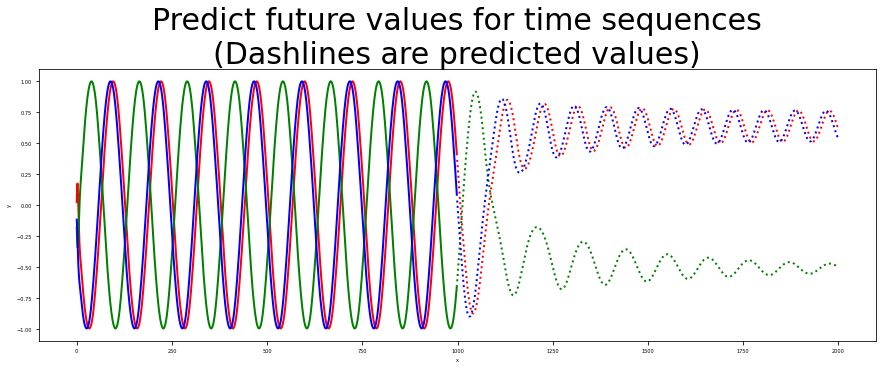

STEP:  200
loss: 0.00037153054697497027
test loss: 0.00011052474910454853
STEP:  201
loss: 0.0003706470189104966
test loss: 0.00011008095491294616
STEP:  202
loss: 0.00036976804767506553
test loss: 0.00010964473068959953
STEP:  203
loss: 0.000368893858594358
test loss: 0.00010921055787394363
STEP:  204
loss: 0.000368024448046241
test loss: 0.00010877407626184763
STEP:  205
loss: 0.00036715942733094037
test loss: 0.00010833545982521156
STEP:  206
loss: 0.00036629878449025415
test loss: 0.00010790013150139787
STEP:  207
loss: 0.00036544265851245653
test loss: 0.00010747393864417394
STEP:  208
loss: 0.0003645908175011195
test loss: 0.00010705774605978695
STEP:  209
loss: 0.0003637430846501426
test loss: 0.00010664753043767168
STEP:  210
loss: 0.00036289956244459467
test loss: 0.00010623881844737646
STEP:  211
loss: 0.000362060171790485
test loss: 0.00010583003106430016
STEP:  212
loss: 0.0003612246928261131
test loss: 0.00010542262806494387
STEP:  213
loss: 0.00036039312722910055
test los

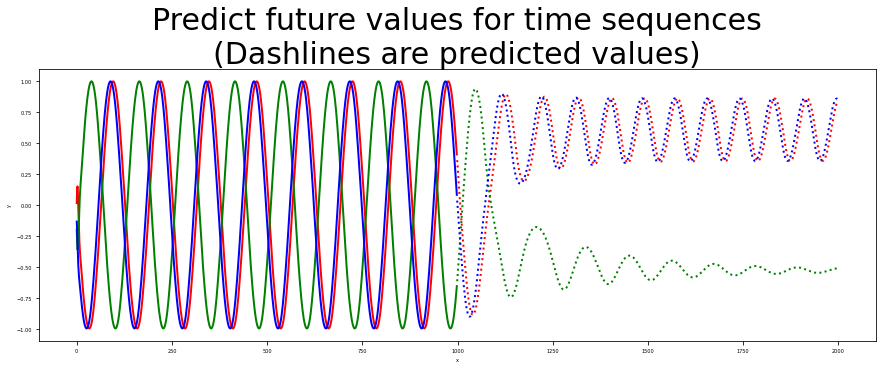

In [8]:
#main function
# ADAM & stacked LSTMS
future = 1000

optimizer_type = 'Adam' #'Adam or 'LBFGS'
# optimizer_type = 'LBFGS' #'Adam or 'LBFGS'

device = 'cuda' #'cuda


# Read more about 'LBFGS' Function https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html
# limited-memory Broyden Fletcher Goldfarb Shannon (L-BFGS)

# Read the following paper to see LBFGS in action for speech recognition application:
# https://ieeexplore.ieee.org/abstract/document/8461550

#model type
# seq = SequenceRNN(device = device)
# seq = SequenceLSTM(device = device)
seq = SequenceLSTMstack(device = device)

seq.double()
criterion = nn.MSELoss()

train_model(steps = 250 if optimizer_type == 'Adam' else 15, \
            seq = seq, \
            input = input, \
            target = target, \
            test_input = test_input, \
            test_target = test_target, \
            criterion = criterion, \
            optimizer_type = optimizer_type,\
            device = device)

STEP:  0
loss: 0.4220012891435551
loss: 0.388838917222616
loss: 1.1771311530230408
loss: 0.015369320693166441
loss: 0.008132291421090872
loss: 0.003354908940324996
loss: 0.003249325032019229
loss: 0.003172341665623932
loss: 0.002895343109917607
loss: 0.0019523106302130407
loss: 7606.1385661377
loss: 393.59714173446235
loss: 353.3865023294214
loss: 71.30161059084304
loss: 4.482710184216134
loss: 1.465318437953039
loss: 0.1618271016340791
loss: 0.05803927655424515
loss: 0.037144268376917845
loss: 0.03212030412296178
test loss: 0.02410141456550738


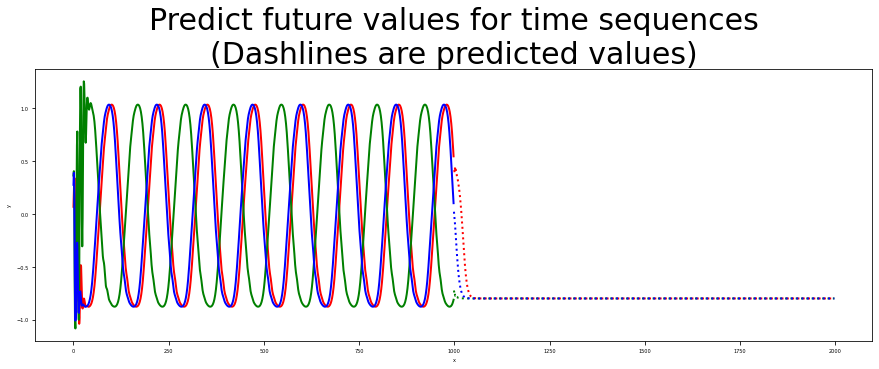

STEP:  1
loss: 0.02511405347541548
loss: 0.01832025673729315
loss: 0.015047731052085775
loss: 0.013064247201031968
loss: 0.011437898557114445
loss: 0.009951091542530825
loss: 0.008370695297917296
loss: 0.006571878055665715
loss: 0.005013029298635151
loss: 0.004309477150796167
loss: 0.0037389227976009198
loss: 0.0032635127590085644
loss: 0.002991726524018394
loss: 0.0028493552149750473
loss: 0.0025461270863569264
loss: 0.0019207940105233328
loss: 0.001498073650373235
loss: 0.0011853470744920813
loss: 0.001075094679041254
loss: 0.000994915433814641
test loss: 0.0005895582254997126


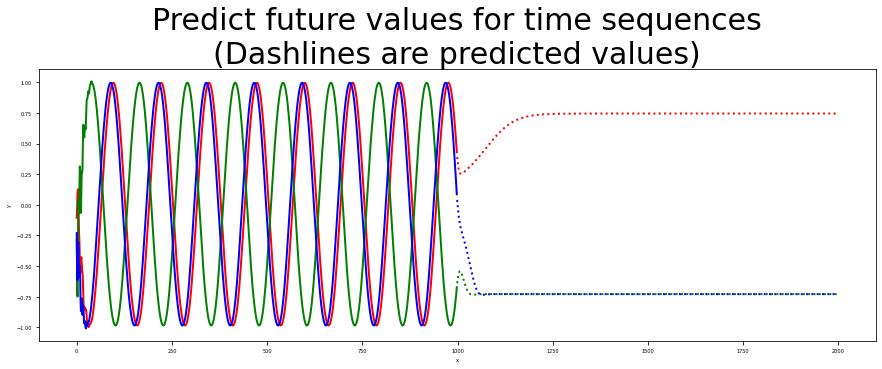

STEP:  2
loss: 0.0009619830558004924
loss: 0.0008615769172161615
loss: 0.00072031469226294
loss: 0.0005910310702655449
loss: 0.0005467286384986526
loss: 0.00046969943565739554
loss: 0.00037304673818988626
loss: 0.00029810965820030536
loss: 0.00027327140228719445
loss: 0.0002678397641537615
loss: 0.0002654040918943011
loss: 0.00025749967333041303
loss: 0.0002392250325722855
loss: 0.00021888418279505478
loss: 0.0001988188659850462
loss: 0.00018049806138142194
loss: 0.00016856926064747854
loss: 0.00016344820976884066
loss: 0.00015960561048627167
loss: 0.0001577371714515424
test loss: 8.727911520767015e-05


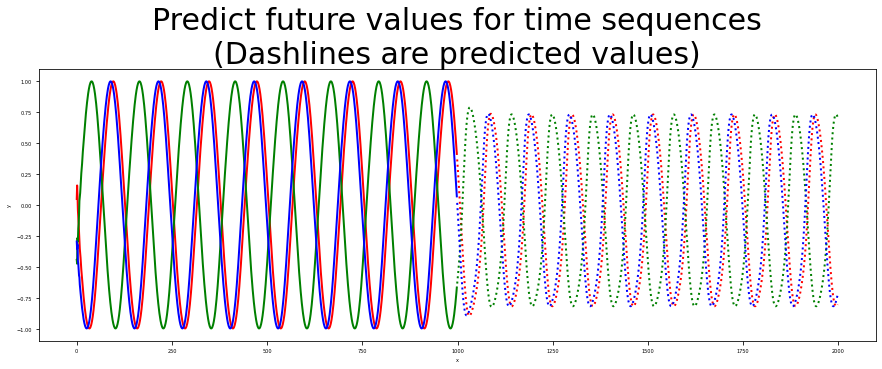

STEP:  3
loss: 0.0001565282687403188
loss: 0.000155736483226803
loss: 0.00015163459524261487
loss: 0.00014189256004637474
loss: 0.00012941486137239825
loss: 0.00011619272949563178
loss: 0.00010905329571050324
loss: 0.000100142639028
loss: 9.705904227073183e-05
loss: 9.628351685671624e-05
loss: 9.554534855949123e-05
loss: 9.409730192620819e-05
loss: 9.024050486311792e-05
loss: 8.290149960811804e-05
loss: 7.82832369272331e-05
loss: 7.023500965823335e-05
loss: 6.299575861424879e-05
loss: 6.152822944877516e-05
loss: 6.0229555399740815e-05
loss: 5.8667390838836446e-05
test loss: 3.638586238323663e-05


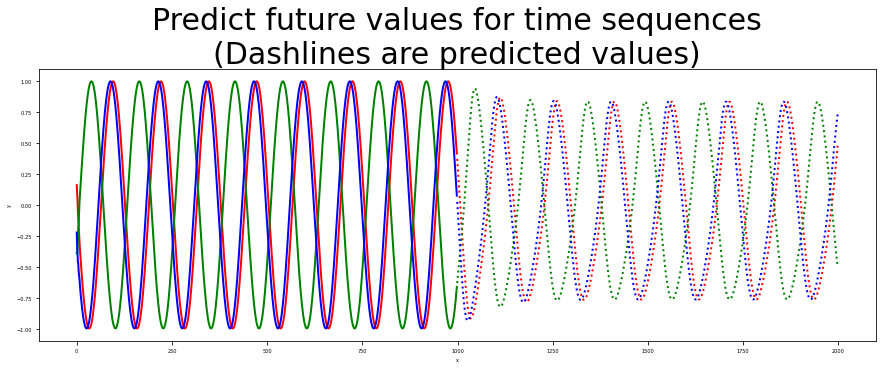

STEP:  4
loss: 5.781721819300883e-05
loss: 5.713323642814018e-05
loss: 5.6853556390015e-05
loss: 5.6201219917000896e-05
loss: 5.5416668717696986e-05
loss: 5.461069539465356e-05
loss: 5.3258206724449425e-05
loss: 5.026489667247828e-05
loss: 4.740308812792735e-05
loss: 4.51425037465154e-05
loss: 4.364816646913034e-05
loss: 4.195859786246488e-05
loss: 3.9769310303101504e-05
loss: 3.8802296511016985e-05
loss: 3.866589287142381e-05
loss: 3.8522397654444056e-05
loss: 3.837615920706849e-05
loss: 3.8123301979155936e-05
loss: 3.777167904693004e-05
loss: 3.730537791177523e-05
test loss: 3.070180550073263e-05


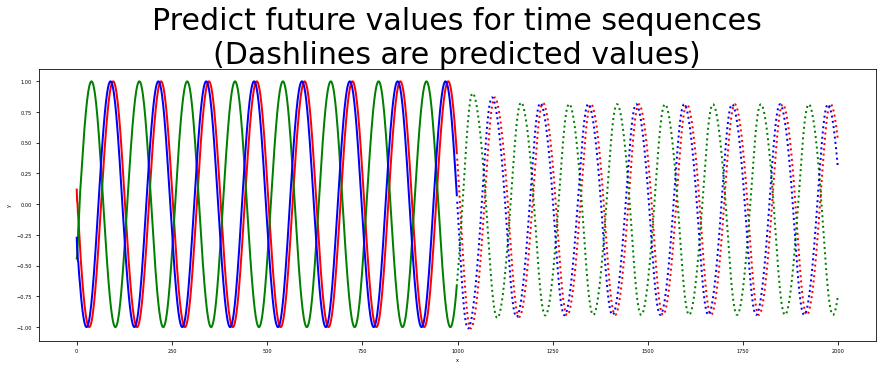

STEP:  5
loss: 3.6644318830800245e-05
loss: 3.5669512238641735e-05
loss: 3.436568594717724e-05
loss: 3.271521510490171e-05
loss: 2.9860332245230404e-05
loss: 2.6774390590559775e-05
loss: 2.581136813959097e-05
loss: 2.8713082655311602e-05
loss: 2.463704657199134e-05
loss: 2.409323227673959e-05
loss: 2.3928300190273408e-05
loss: 2.378588955930765e-05
loss: 2.3704822496694968e-05
loss: 2.3611164342212797e-05
loss: 2.33965965062372e-05
loss: 2.2899961614267213e-05
loss: 2.187078831758518e-05
loss: 2.0128274023004995e-05
loss: 2.065934780863375e-05
loss: 1.8545818693592418e-05
test loss: 2.2989561633760498e-05


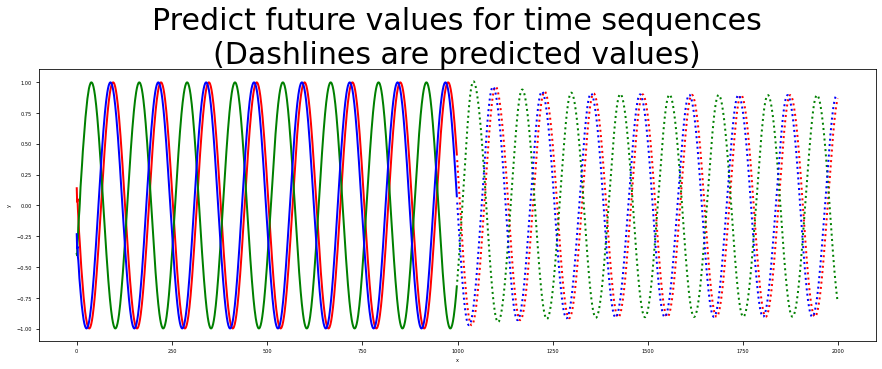

STEP:  6
loss: 1.7459266882995528e-05
loss: 1.6919558629103728e-05
loss: 1.589007081762281e-05
loss: 1.5411124350210483e-05
loss: 1.5229257702135204e-05
loss: 1.5043785117648804e-05
loss: 1.499736091706199e-05
loss: 1.4960411958410038e-05
loss: 1.4951149216249894e-05
loss: 1.4943283626324665e-05
loss: 1.4913147733943862e-05
loss: 1.4847864567190882e-05
loss: 1.4748930561883536e-05
loss: 1.460175559591984e-05
loss: 1.438040651232282e-05
loss: 1.3931299455746278e-05
loss: 1.3576371124940943e-05
loss: 1.3402427278423704e-05
loss: 1.3419498946002639e-05
loss: 1.3332545320262569e-05
test loss: 2.222835394425034e-05


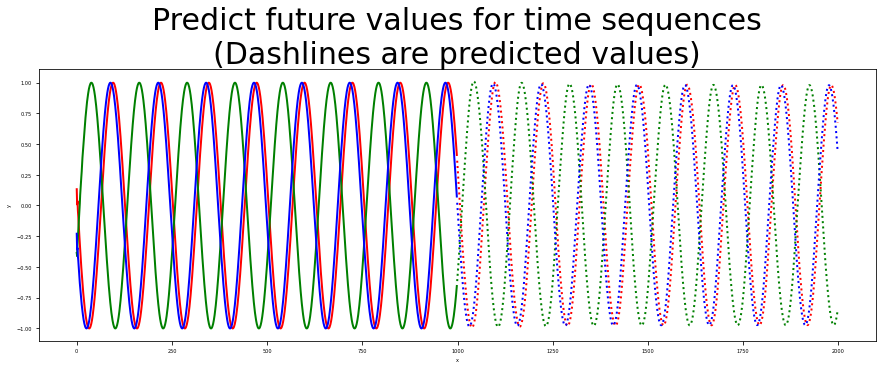

STEP:  7
loss: 1.3316296945363795e-05
loss: 1.3295260826615879e-05
loss: 1.3281913019843074e-05
loss: 1.3269151412538292e-05
loss: 1.3138328031866002e-05
loss: 1.264981462891051e-05
loss: 1.246731285945152e-05
loss: 1.239039108918986e-05
loss: 1.2340308217090477e-05
loss: 1.230316266323233e-05
loss: 1.2291471622780756e-05
loss: 1.2285295614880607e-05
loss: 1.227841835354137e-05
loss: 1.2269201778569909e-05
loss: 1.2255500746468796e-05
loss: 1.2237862539785886e-05
loss: 1.221299120808499e-05
loss: 1.217636280833762e-05
loss: 1.2122818441520628e-05
loss: 1.2049257334323619e-05
test loss: 1.9142962226105307e-05


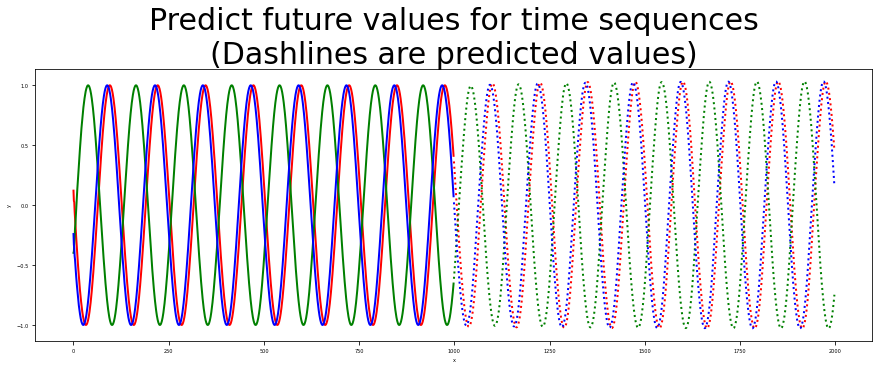

STEP:  8
loss: 1.1945986436207677e-05
loss: 1.1862903695975112e-05
loss: 1.1769486954044305e-05
loss: 1.1676528358145753e-05
loss: 1.159073537595646e-05
loss: 1.1580324407901938e-05
loss: 1.157400558255121e-05
loss: 1.1569375676659818e-05
loss: 1.1565914055051452e-05
loss: 1.156200029839277e-05
loss: 1.155408338513097e-05
loss: 1.153679986089375e-05
loss: 1.1501513288470552e-05
loss: 1.1451259291190692e-05
loss: 1.1411529082045194e-05
loss: 1.138527304054881e-05
loss: 1.1352543019095105e-05
loss: 1.132739047675497e-05
loss: 1.1312177846133751e-05
loss: 1.1309776112329212e-05
test loss: 1.8535819835830447e-05


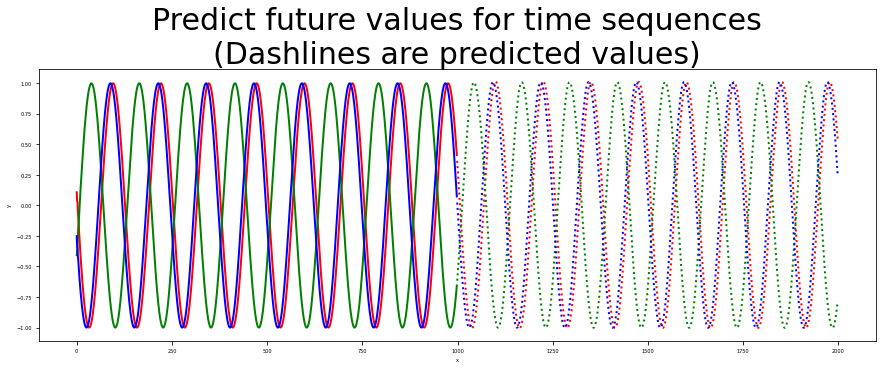

STEP:  9
loss: 1.1307046980225495e-05
loss: 1.1303613163480368e-05
loss: 1.1301533290785903e-05
loss: 1.1299401790202173e-05
loss: 1.1296544908744684e-05
loss: 1.1291891677913329e-05
loss: 1.128297528050476e-05
loss: 1.126324062451697e-05
loss: 1.1220158805025719e-05
loss: 1.1135073072754342e-05
loss: 1.1006068672943528e-05
loss: 1.0892817070521874e-05
loss: 1.0913553842005134e-05
loss: 1.0747558038577391e-05
loss: 1.0665062386193166e-05
loss: 1.0530128150865852e-05
loss: 1.0497968880440089e-05
loss: 1.0446936685514354e-05
loss: 1.0455090913048585e-05
loss: 1.0412464937955479e-05
test loss: 1.802875775458944e-05


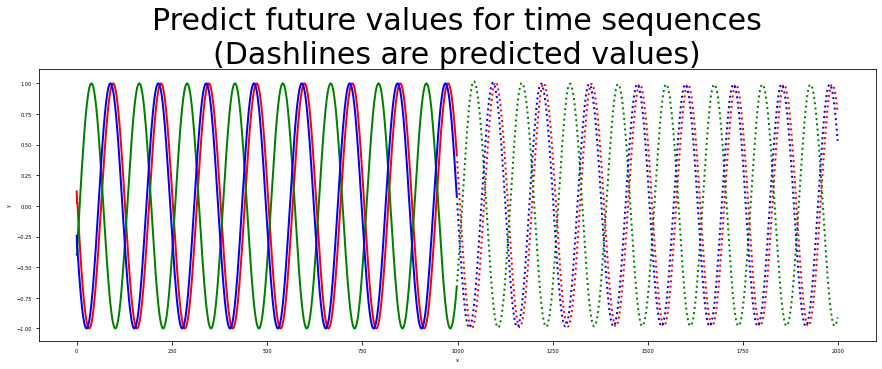

STEP:  10
loss: 1.0397602618096942e-05
loss: 1.0388982004341792e-05
loss: 1.036021891506614e-05
loss: 1.03515562921342e-05
loss: 1.0343296266416626e-05
loss: 1.0335062389358008e-05
loss: 1.0327344697105365e-05
loss: 1.0316615540717512e-05
loss: 1.0290581781888372e-05
loss: 1.0238962227219887e-05
loss: 1.016235051882254e-05
loss: 1.0080870809250251e-05
loss: 1.0137569903923605e-05
loss: 1.053469615010681e-05
loss: 1.0086931269551232e-05
loss: 9.995117582981891e-06
loss: 9.974334071420807e-06
loss: 9.913895088166065e-06
loss: 9.834547780302659e-06
loss: 9.716771221468826e-06
test loss: 1.662114136462523e-05


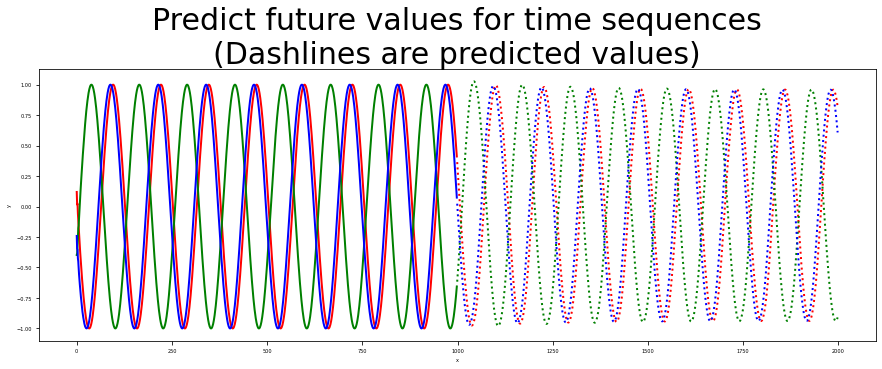

STEP:  11
loss: 9.640434350791398e-06
loss: 9.525315738558084e-06
loss: 9.426056041160428e-06
loss: 9.349937383090349e-06
loss: 9.243365856963432e-06
loss: 9.185834452170501e-06
loss: 9.13136424517887e-06
loss: 9.094904352188316e-06
loss: 9.052906247658453e-06
loss: 9.019680972806174e-06
loss: 8.988660666971393e-06
loss: 8.974895104881987e-06
loss: 8.966689372970147e-06
loss: 8.963173629310355e-06
loss: 8.9610654373287e-06
loss: 8.958523899015546e-06
loss: 8.957526933281272e-06
test loss: 1.5597115964972664e-05


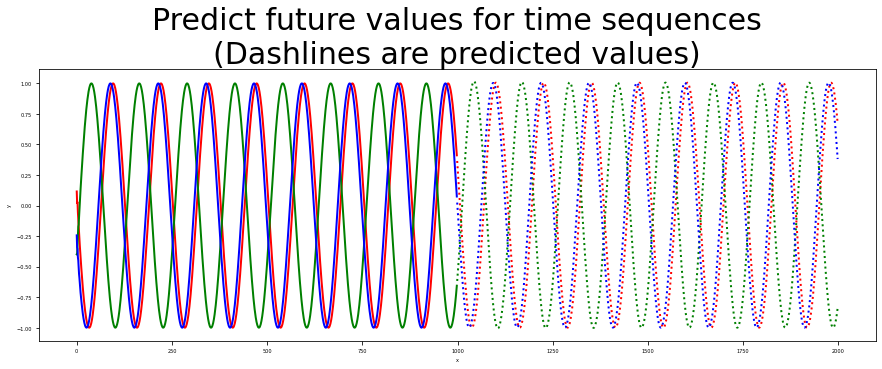

STEP:  12
loss: 8.957526933281272e-06
loss: 8.956684349663677e-06
test loss: 1.5588065613600074e-05


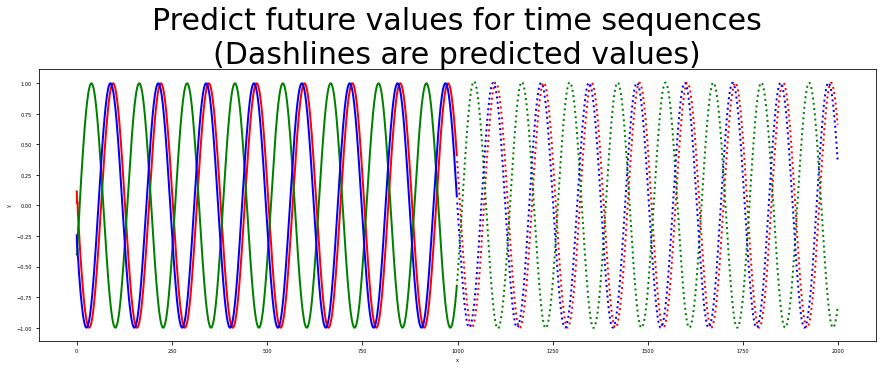

STEP:  13
loss: 8.956684349663677e-06
loss: 8.95547099322846e-06
loss: 8.953588161167504e-06
loss: 8.949405892984811e-06
loss: 8.941326321517947e-06
loss: 8.923941131765185e-06
loss: 8.891587404678477e-06
loss: 8.842764446287341e-06
loss: 8.776972231816528e-06
loss: 8.674725034503347e-06
loss: 8.405161137851612e-06
loss: 8.886876713515747e-06
loss: 8.12939090293984e-06
loss: 8.073896891894285e-06
loss: 7.930012470022585e-06
loss: 7.777284556400599e-06
loss: 7.698048676194135e-06
loss: 7.6220676406071555e-06
loss: 7.56028992532405e-06
loss: 7.528045093686435e-06
test loss: 1.21636296095827e-05


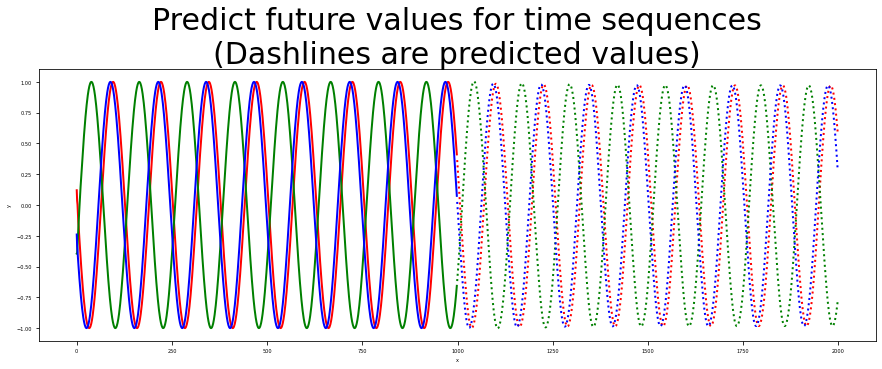

STEP:  14
loss: 7.50379391880916e-06
loss: 7.48596077475847e-06
loss: 7.470012436602408e-06
loss: 7.45157490841185e-06
loss: 7.417982260738188e-06
loss: 7.369864124832412e-06
loss: 7.31901974465468e-06
loss: 7.2753025955947635e-06
loss: 7.2592775212832506e-06
loss: 7.224043869655096e-06
loss: 7.204025114765824e-06
loss: 7.186042221237429e-06
loss: 7.1733854920062106e-06
loss: 7.164109128558845e-06
loss: 7.157586785505149e-06
loss: 7.153155946126256e-06
loss: 7.149087119233456e-06
loss: 7.143376429430083e-06
loss: 7.133774008323468e-06
loss: 7.1233245811351655e-06
test loss: 1.0853845477014825e-05


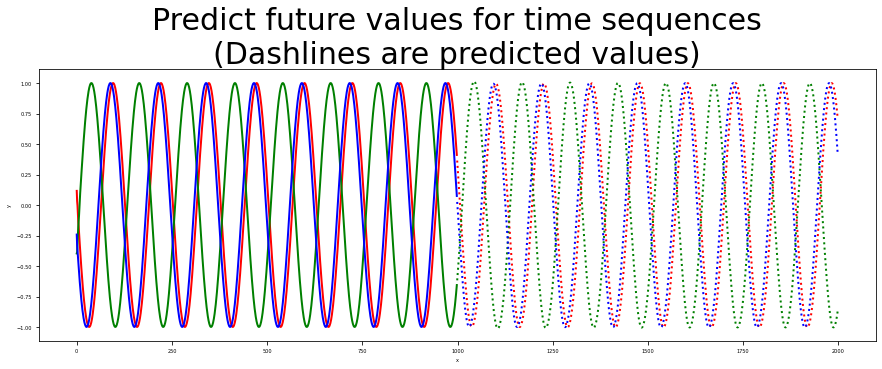

In [9]:
#main function
# LBFGS & RNN
future = 1000

# optimizer_type = 'Adam' #'Adam or 'LBFGS'
optimizer_type = 'LBFGS' #'Adam or 'LBFGS'

device = 'cuda' #'cuda


# Read more about 'LBFGS' Function https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html
# limited-memory Broyden Fletcher Goldfarb Shannon (L-BFGS)

# Read the following paper to see LBFGS in action for speech recognition application:
# https://ieeexplore.ieee.org/abstract/document/8461550

#model type
seq = SequenceRNN(device = device)
# seq = SequenceLSTM(device = device)
# seq = SequenceLSTMstack(device = device)

seq.double()
criterion = nn.MSELoss()

train_model(steps = 250 if optimizer_type == 'Adam' else 15, \
            seq = seq, \
            input = input, \
            target = target, \
            test_input = test_input, \
            test_target = test_target, \
            criterion = criterion, \
            optimizer_type = optimizer_type,\
            device = device)

STEP:  0
loss: 0.5371247859311286
loss: 0.5151012836372514
loss: 0.2983889694353248
loss: 0.10778029176322795
loss: 0.07806402061519856
loss: 0.008657867347876833
loss: 0.007854109165318028
loss: 0.007682067048656924
loss: 0.0075518807893749235
loss: 0.007216402514036177
loss: 0.006513814151961911
loss: 0.0049899200017023086
loss: 0.001841222550925522
loss: 0.0016747991774380625
loss: 0.001543168990605738
loss: 0.0013006191586741472
loss: 0.0009916458599506996
loss: 0.0005789312860842018
loss: 0.0004983708085299672
loss: 0.00046215942319828053
test loss: 0.0002933600957771173


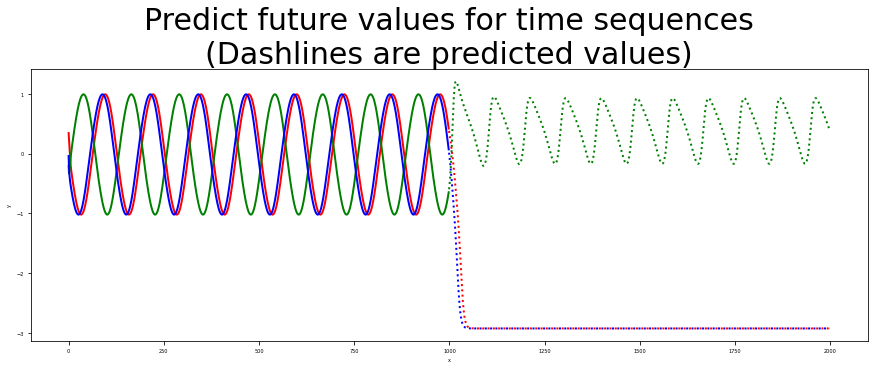

STEP:  1
loss: 0.00035245112203862903
loss: 0.00024093313229191473
loss: 0.00020381301216913718
loss: 0.00019712670016315366
loss: 0.00019681128159197443
loss: 0.00019655898958359277
loss: 0.00019599045389994907
loss: 0.00019417774863576917
loss: 0.00019010075369973295
loss: 0.0001812074412855376
loss: 0.00016328107884567734
loss: 0.00013382280897485186
loss: 0.00011565272147339465
loss: 0.00011007341822181288
loss: 0.00010632105713401624
loss: 0.00010434366986075919
loss: 0.00010405610389357878
loss: 0.0001039775080525298
loss: 0.00010393587551799137
loss: 0.00010389801955502905
test loss: 5.354260732112588e-05


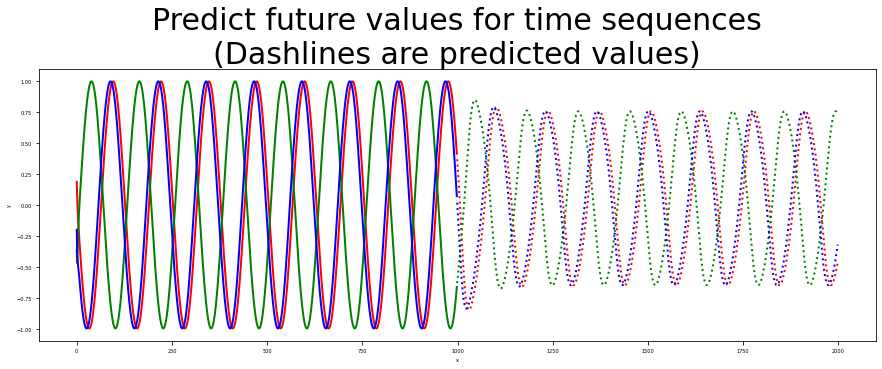

STEP:  2
loss: 0.00010386118675015156
loss: 0.00010381340426921988
loss: 0.00010371379607176236
loss: 0.00010346319699506208
loss: 0.00010287905258856293
loss: 0.00010154681061497644
loss: 9.850019835261546e-05
loss: 9.154582959573518e-05
loss: 8.567688462750069e-05
loss: 7.701041885569894e-05
loss: 7.322384188974132e-05
loss: 6.912238224372783e-05
loss: 6.76597201710751e-05
loss: 6.743999094792879e-05
loss: 6.724463627392185e-05
loss: 6.716310126920048e-05
loss: 6.693642246325094e-05
loss: 6.635879384189515e-05
loss: 6.490732907176072e-05
loss: 6.354498898008076e-05
test loss: 3.4076636939261564e-05


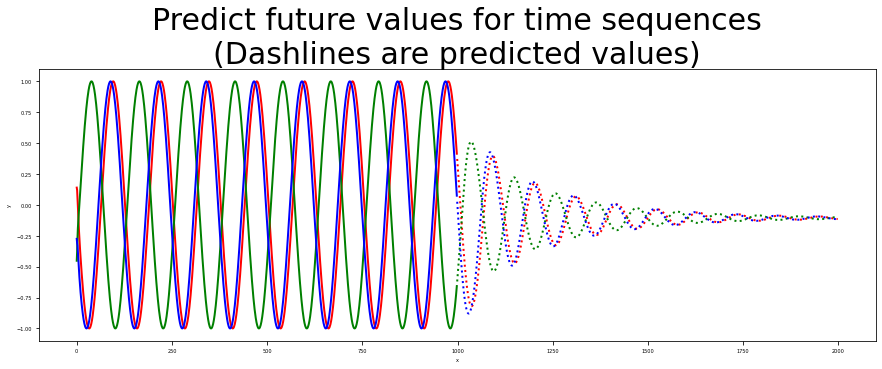

STEP:  3
loss: 6.158119618519341e-05
loss: 6.561154625077181e-05
loss: 5.516469004437917e-05
loss: 5.2202116874162386e-05
loss: 4.67976906711281e-05
loss: 4.5523020152700876e-05
loss: 4.5171248128589735e-05
loss: 4.495371196067325e-05
loss: 4.4610622113775034e-05
loss: 4.3925173510277635e-05
loss: 4.306259825111081e-05
loss: 4.2259239481677364e-05
loss: 4.162353146460838e-05
loss: 4.1158887604086355e-05
loss: 4.0820294263972935e-05
loss: 4.037549299455501e-05
loss: 3.989264126607521e-05
loss: 3.915270106422309e-05
loss: 3.7733072861634436e-05
loss: 3.4956105074889235e-05
test loss: 1.9389284260692608e-05


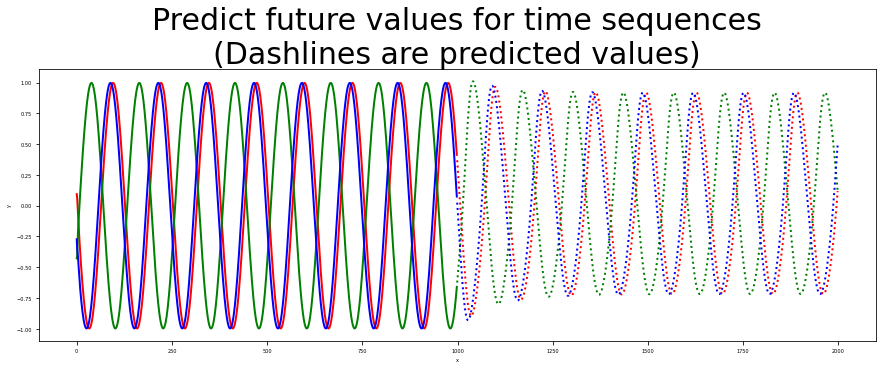

STEP:  4
loss: 3.1774199580933124e-05
loss: 3.052078391687429e-05
loss: 3.1594303537114066e-05
loss: 2.844467841065531e-05
loss: 2.7397397066250273e-05
loss: 2.596065791150539e-05
loss: 2.538495747038399e-05
loss: 2.523637932910463e-05
loss: 2.5077572839056908e-05
loss: 2.5042247106168222e-05
loss: 2.4996806240863286e-05
loss: 2.4895171718898634e-05
loss: 2.4766029885868357e-05
loss: 2.4621780100441455e-05
loss: 2.4459992395985956e-05
loss: 2.4179328982533845e-05
loss: 2.362687924608937e-05
loss: 2.2300177588714784e-05
loss: 2.0912669979451274e-05
loss: 1.907827493735722e-05
test loss: 2.20685477609382e-05


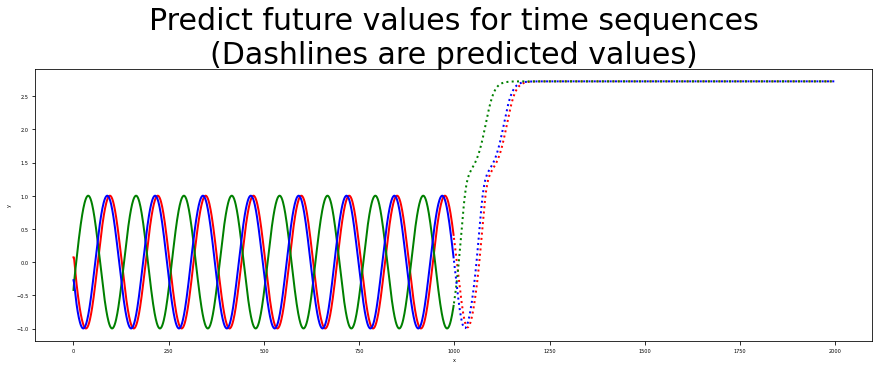

STEP:  5
loss: 2.1850361312486704e-05
loss: 1.7444412028673164e-05
loss: 1.579514223003617e-05
loss: 1.5073433440686117e-05
loss: 1.4800263838005096e-05
loss: 1.4554761830746342e-05
loss: 1.4202189540852334e-05
loss: 1.3662494166150205e-05
loss: 1.317329579053865e-05
loss: 1.2482633382156561e-05
loss: 1.195298352520705e-05
loss: 1.171912292606418e-05
loss: 1.150933030528284e-05
loss: 1.1463593887856914e-05
loss: 1.13775164660692e-05
loss: 1.1352403635536316e-05
loss: 1.1320121542663378e-05
loss: 1.1279647988254876e-05
loss: 1.1201946468683128e-05
loss: 1.0928218509738464e-05
test loss: 1.1052896697354981e-05


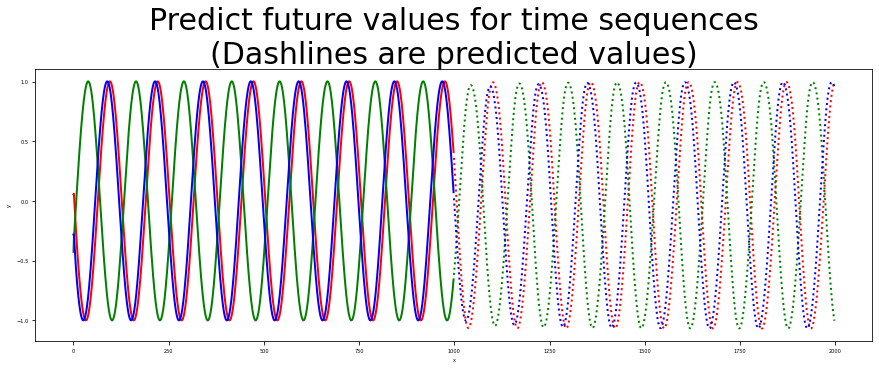

STEP:  6
loss: 1.0385866051031626e-05
loss: 9.675076673744646e-06
loss: 8.873679272735778e-06
loss: 1.0201447463980417e-05
loss: 7.590755177018013e-06
loss: 7.256416179363876e-06
loss: 6.633088112409771e-06
loss: 6.101066326972652e-06
loss: 5.54438776084416e-06
loss: 5.440775380914265e-06
loss: 5.420062455173242e-06
loss: 5.4097968578056336e-06
loss: 5.395124997749507e-06
loss: 5.383793029256232e-06
loss: 5.378811891746058e-06
loss: 5.3762786523331395e-06
loss: 5.3740557149880885e-06
loss: 5.371529370313932e-06
loss: 5.36779260372711e-06
loss: 5.359984709521649e-06
test loss: 8.359306459746273e-06


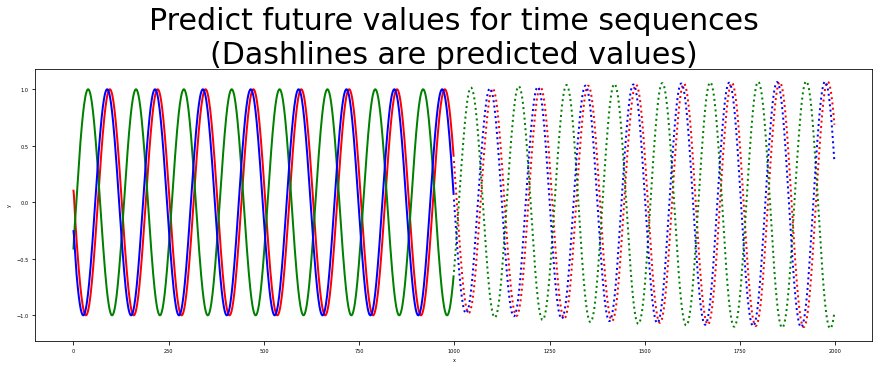

STEP:  7
loss: 5.346820293605177e-06
loss: 5.330566794420292e-06
loss: 5.303078215998673e-06
loss: 5.2644964577853235e-06
loss: 5.216745678493891e-06
loss: 5.15789463837702e-06
loss: 5.083112351538769e-06
loss: 4.998125086130068e-06
loss: 4.90854784095179e-06
loss: 4.827603317628444e-06
loss: 4.790345216506711e-06
loss: 4.783327637977088e-06
loss: 4.7786448909890705e-06
loss: 4.777832007395358e-06
test loss: 7.4606155241893205e-06


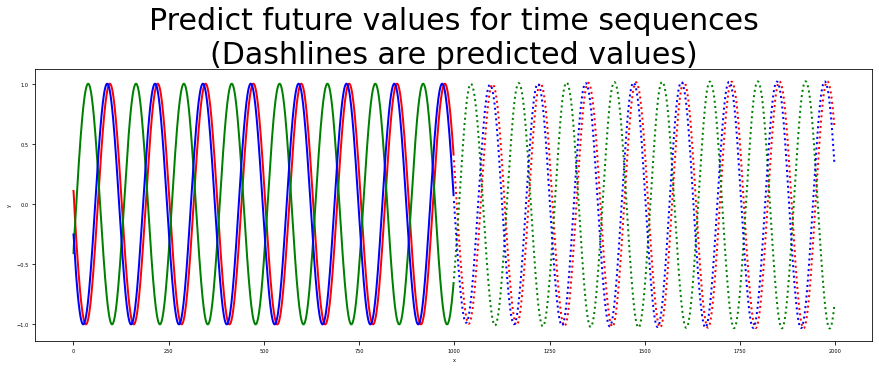

STEP:  8
loss: 4.777832007395358e-06
loss: 4.776715758733142e-06
loss: 4.775830843349217e-06
test loss: 7.439271028871501e-06


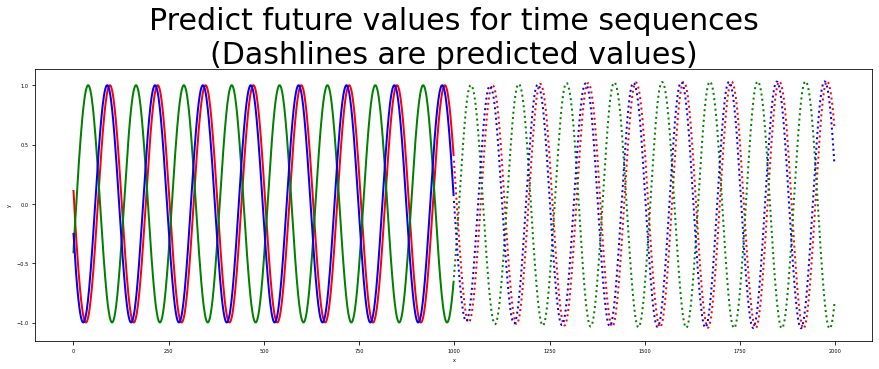

STEP:  9
loss: 4.775830843349217e-06
loss: 4.773887956204069e-06
loss: 4.771814609103948e-06
loss: 4.767744787000904e-06
loss: 4.759344468880083e-06
loss: 4.7404769926452334e-06
loss: 4.69741581879081e-06
loss: 4.632265303003241e-06
loss: 4.544036616695786e-06
loss: 4.703834352866724e-06
loss: 4.472107296752751e-06
loss: 4.535920071953074e-06
loss: 4.405737925554427e-06
loss: 4.366629059004806e-06
loss: 4.346020878797353e-06
loss: 4.322869860498974e-06
loss: 4.306281609600099e-06
loss: 4.2981422761551705e-06
loss: 4.295485864631563e-06
loss: 4.294880076867971e-06
test loss: 6.79171838615793e-06


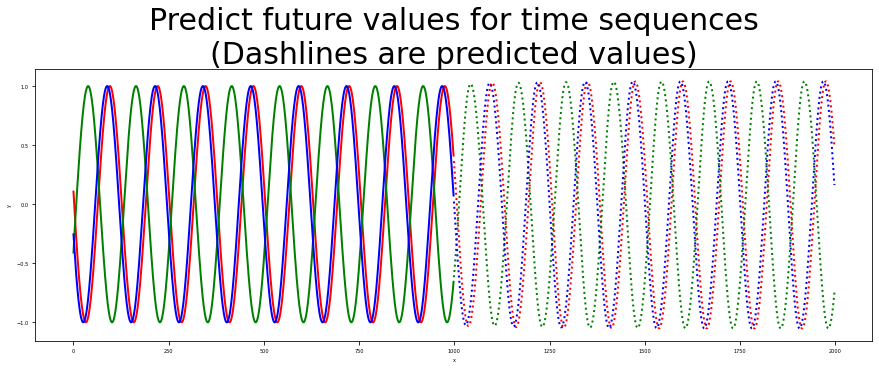

STEP:  10
loss: 4.294880076867971e-06
test loss: 6.79171838615793e-06


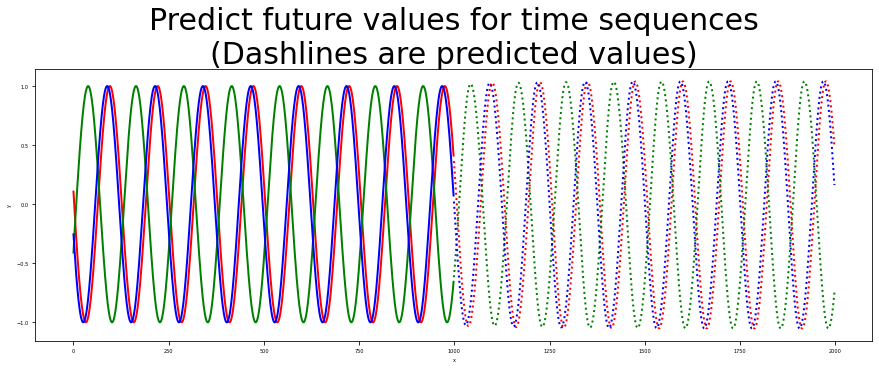

STEP:  11
loss: 4.294880076867971e-06
test loss: 6.79171838615793e-06


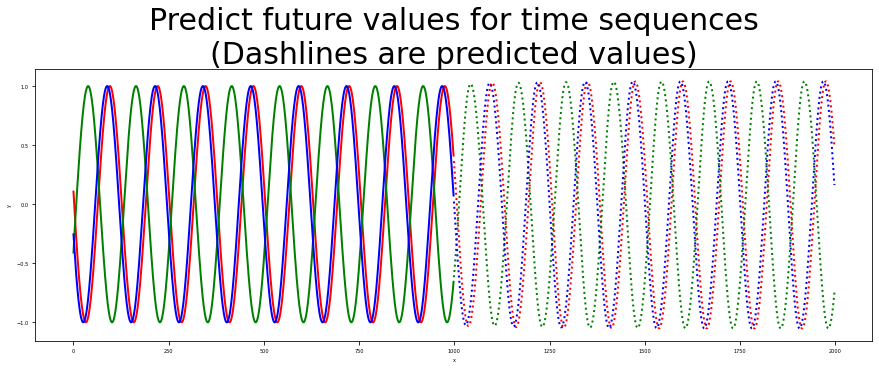

STEP:  12
loss: 4.294880076867971e-06
test loss: 6.79171838615793e-06


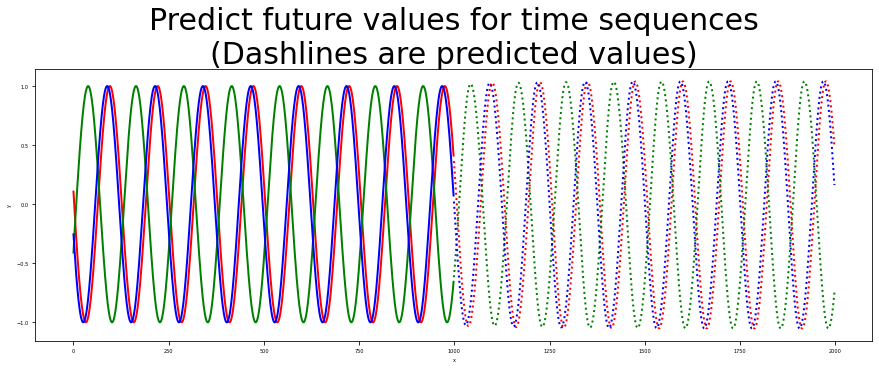

STEP:  13
loss: 4.294880076867971e-06
test loss: 6.79171838615793e-06


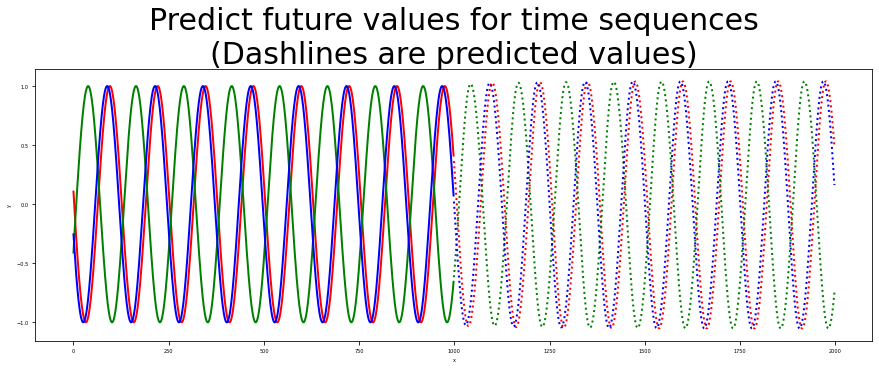

STEP:  14
loss: 4.294880076867971e-06
test loss: 6.79171838615793e-06


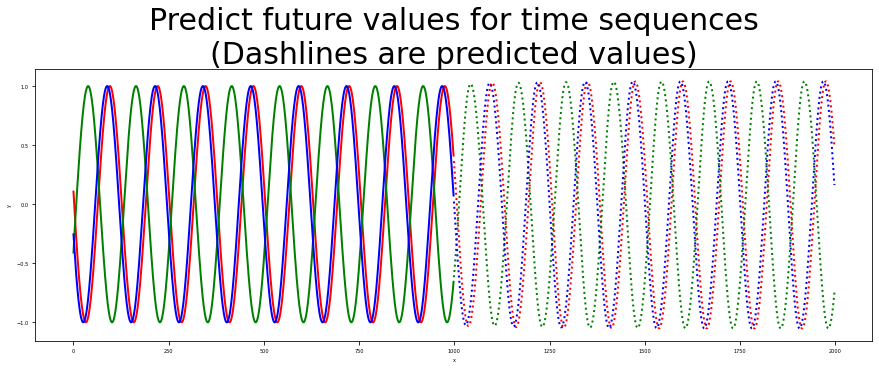

In [10]:
#main function
# LBFGS & LSTM
future = 1000

# optimizer_type = 'Adam' #'Adam or 'LBFGS'
optimizer_type = 'LBFGS' #'Adam or 'LBFGS'

device = 'cuda' #'cuda


# Read more about 'LBFGS' Function https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html
# limited-memory Broyden Fletcher Goldfarb Shannon (L-BFGS)

# Read the following paper to see LBFGS in action for speech recognition application:
# https://ieeexplore.ieee.org/abstract/document/8461550

#model type
# seq = SequenceRNN(device = device)
seq = SequenceLSTM(device = device)
# seq = SequenceLSTMstack(device = device)

seq.double()
criterion = nn.MSELoss()

train_model(steps = 250 if optimizer_type == 'Adam' else 15, \
            seq = seq, \
            input = input, \
            target = target, \
            test_input = test_input, \
            test_target = test_target, \
            criterion = criterion, \
            optimizer_type = optimizer_type,\
            device = device)

STEP:  0
loss: 0.4914828544193397
loss: 0.48872470249405087
loss: 0.42752766052111507
loss: 0.21681713564957297
loss: 0.02970792917164186
loss: 0.028841481954061162
loss: 0.024313804777504364
loss: 0.023984461411012094
loss: 0.02321510611205121
loss: 0.021762447402961543
loss: 0.019022243155498813
loss: 0.014477940202256004
loss: 0.0053722426021377
loss: 0.004866809133883437
loss: 0.00407561823193259
loss: 0.0032846611502581496
loss: 0.0023786593618131736
loss: 0.001489450548659732
loss: 0.0009366934191372705
loss: 0.0007944275068271964
test loss: 0.0007230666109512131


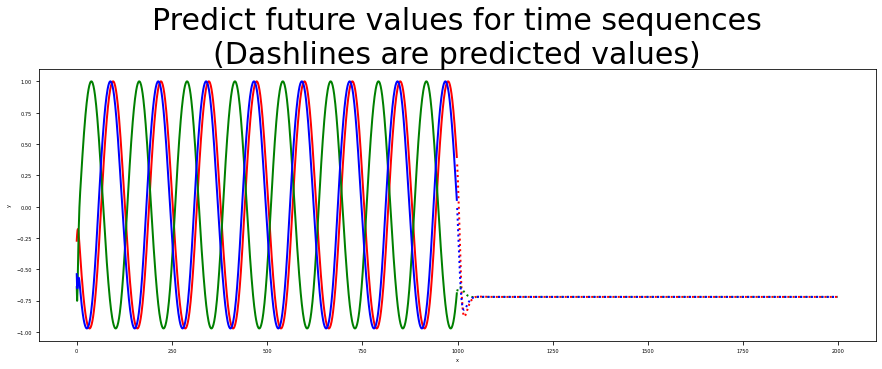

STEP:  1
loss: 0.000730770866543946
loss: 0.0007188489473722974
loss: 0.0006978823202278848
loss: 0.000670317092563582
loss: 0.0006124139006568024
loss: 0.0006044981381875651
loss: 0.0005996608361951353
loss: 0.0005859517796449177
loss: 0.0005525776678788439
loss: 0.00048809709496743447
loss: 0.0003941949419296649
loss: 0.00031488452976586483
loss: 0.00026489603110889793
loss: 0.00023274384129272523
loss: 0.0002161508737068161
loss: 0.00020520071538315053
loss: 0.00020312853227525202
loss: 0.00020279527853938229
loss: 0.00020263058085813243
loss: 0.00020213878651366996
test loss: 8.80746194524824e-05


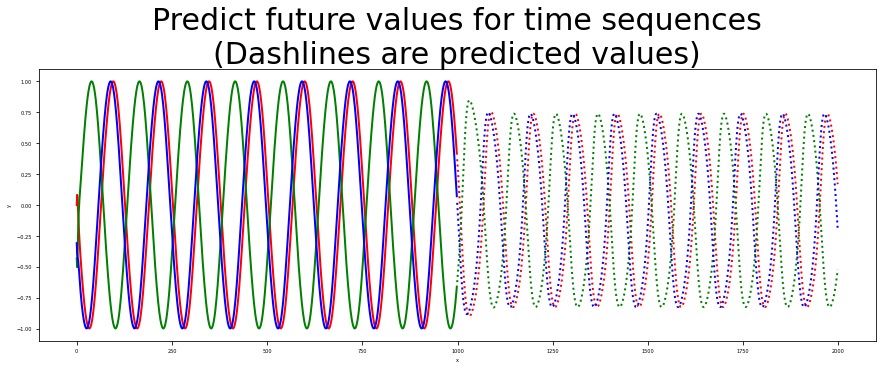

STEP:  2
loss: 0.00020103246865501792
loss: 0.00019872103689261007
loss: 0.0001940588938703478
loss: 0.00018583296452240135
loss: 0.0001743226059852626
loss: 0.00016650959468880532
loss: 0.00016046440449610694
loss: 0.00015894663916179145
loss: 0.0001584893259912149
loss: 0.00015794404524953565
loss: 0.00015608724256978233
loss: 0.0001520045073642615
loss: 0.0001463298618723356
loss: 0.0001368251997325557
loss: 0.0001252930033886816
loss: 0.000137293923634023
loss: 0.00011650545303784739
loss: 0.00011358853374167897
loss: 0.00011138405189802853
loss: 0.00010758769769480423
test loss: 4.23791060762598e-05


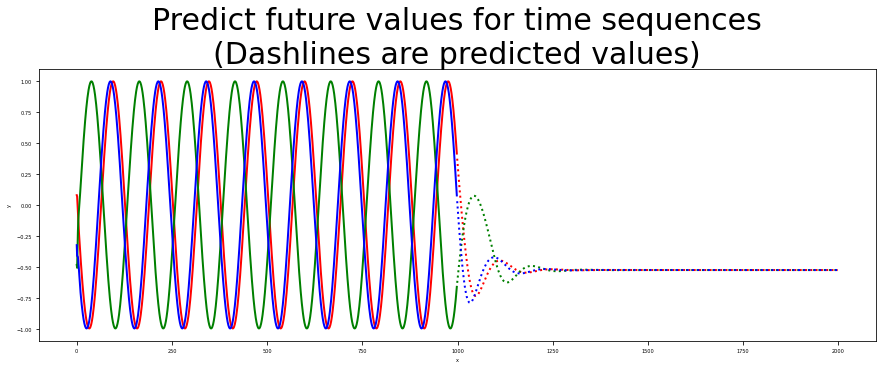

STEP:  3
loss: 0.00010560457613947249
loss: 0.00010332851323309125
loss: 0.00010163279848996515
loss: 0.00010098034741237339
loss: 0.00010080348565191596
loss: 0.00010014401767463217
loss: 9.966443836278693e-05
loss: 9.919672511113141e-05
loss: 9.891750594455837e-05
loss: 9.812125849638599e-05
loss: 9.680646771697585e-05
loss: 9.484406394046863e-05
loss: 9.035083694101248e-05
loss: 7.901804768177042e-05
loss: 6.458960773093802e-05
loss: 5.197319038652064e-05
loss: 3.766099820817606e-05
loss: 0.0005477444326124375
loss: 4.437190840302157e-05
loss: 0.00020700528165371407
test loss: 1.7910668491474388e-05


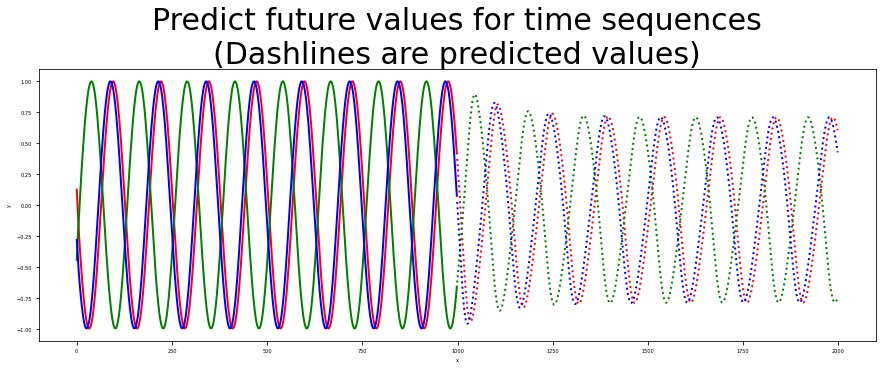

STEP:  4
loss: 2.8816906680439695e-05
loss: 2.8352546563815497e-05
loss: 2.798060229107837e-05
loss: 2.7051208728490803e-05
loss: 2.662428782928094e-05
loss: 2.5990006696673306e-05
loss: 2.5471258640546955e-05
loss: 2.5162761276951827e-05
loss: 2.488073139690967e-05
loss: 2.44508467831835e-05
loss: 2.3938932592039597e-05
loss: 2.3347623407629323e-05
loss: 2.3028770721226034e-05
loss: 2.234537983946805e-05
loss: 2.206989487542237e-05
loss: 2.1790205536325908e-05
loss: 2.1689779339801534e-05
loss: 2.152901192618033e-05
loss: 2.134098477833954e-05
loss: 2.1042738882875426e-05
test loss: 1.784758382184027e-05


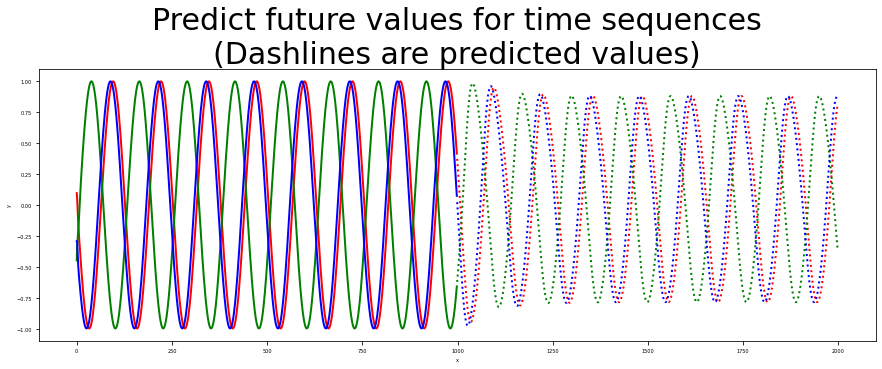

STEP:  5
loss: 2.0715994736324592e-05
loss: 2.0319162597580558e-05
loss: 1.9680706481581703e-05
loss: 1.9201333268371485e-05
loss: 1.8329653682320113e-05
loss: 1.7244932076081223e-05
loss: 1.6575698602578184e-05
loss: 1.6216825875296565e-05
loss: 1.6097104726537848e-05
loss: 1.598126530908335e-05
loss: 1.581326445387619e-05
loss: 1.5590748144859484e-05
loss: 1.550274972204841e-05
loss: 1.540662211840893e-05
loss: 1.4973810054042806e-05
loss: 1.4334060304542757e-05
loss: 1.3318737909334929e-05
loss: 1.2489026029586323e-05
loss: 1.2026724075620047e-05
loss: 1.1742978741998862e-05
test loss: 1.3326622069935484e-05


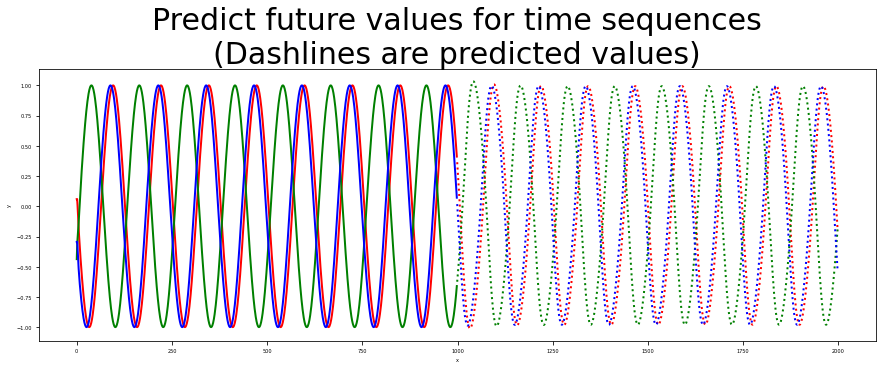

STEP:  6
loss: 1.1505854814978236e-05
loss: 1.1247277394022136e-05
loss: 1.0833570478937379e-05
loss: 1.0592568194778823e-05
loss: 1.0488823112343852e-05
loss: 1.044950957918148e-05
loss: 1.0429021072036627e-05
loss: 1.0424566674462838e-05
loss: 1.0419512263198304e-05
loss: 1.0410571403273049e-05
loss: 1.038599109918784e-05
loss: 1.0325553015717946e-05
loss: 1.0176069932064822e-05
loss: 9.90153816902597e-06
loss: 9.488421340023434e-06
loss: 8.988999177493623e-06
loss: 8.856633934196974e-06
loss: 8.705310337915224e-06
loss: 8.629722626443738e-06
loss: 8.611872328881987e-06
test loss: 1.3530576898344343e-05


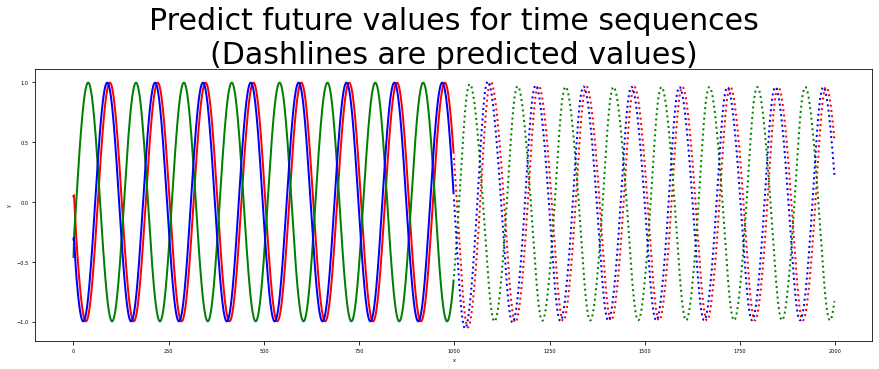

STEP:  7
loss: 8.489420799285138e-06
loss: 8.444959930866215e-06
loss: 8.407686313195168e-06
loss: 8.370576390472006e-06
loss: 8.312045245756243e-06
loss: 8.279207556301285e-06
loss: 8.249071336874855e-06
loss: 8.139195997088842e-06
loss: 7.998076324064577e-06
loss: 7.723898356060146e-06
loss: 7.369245774034718e-06
loss: 7.030424304238583e-06
loss: 6.770726942104363e-06
loss: 6.46775058571377e-06
loss: 6.115518637484904e-06
loss: 5.803165228009792e-06
loss: 5.705779079509466e-06
loss: 5.371336716601974e-06
loss: 5.267971736227957e-06
loss: 5.217302928376761e-06
test loss: 7.41798755383699e-06


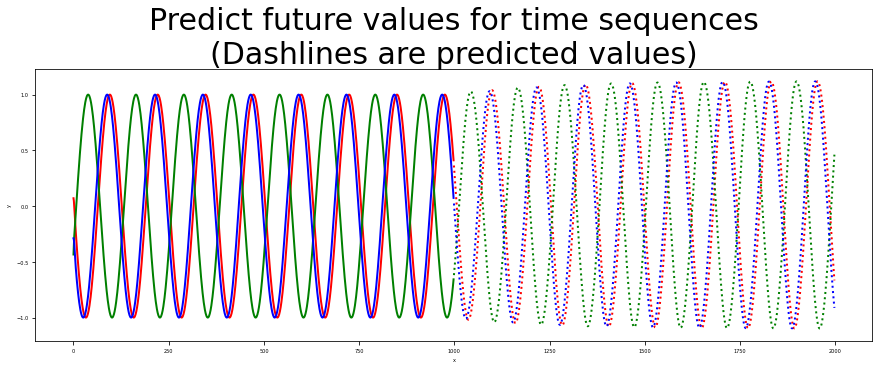

STEP:  8
loss: 5.124929314649975e-06
loss: 5.096393724654466e-06
loss: 5.077955086687352e-06
loss: 5.071873362515091e-06
loss: 5.069518570928762e-06
loss: 5.067930310963871e-06
test loss: 7.288081235795972e-06


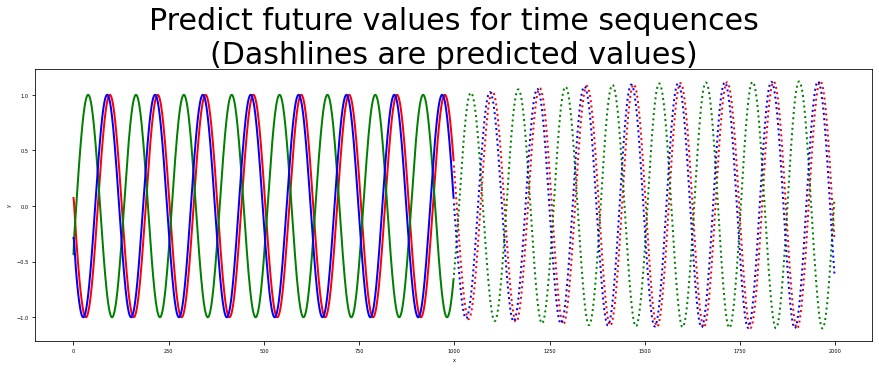

STEP:  9
loss: 5.067930310963871e-06
test loss: 7.288081235795972e-06


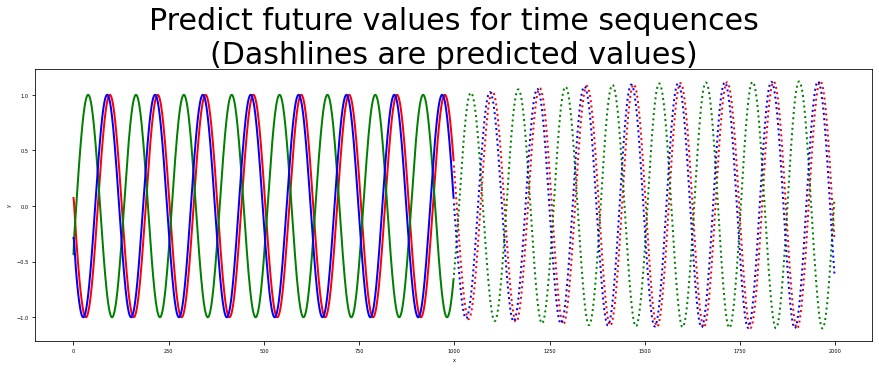

STEP:  10
loss: 5.067930310963871e-06
test loss: 7.288081235795972e-06


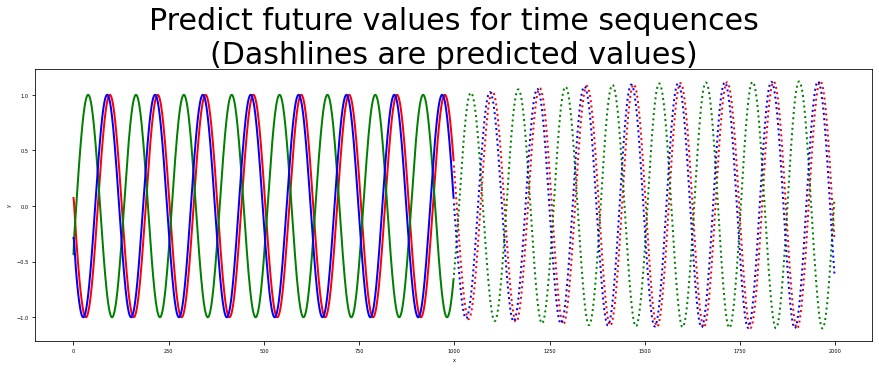

STEP:  11
loss: 5.067930310963871e-06
test loss: 7.288081235795972e-06


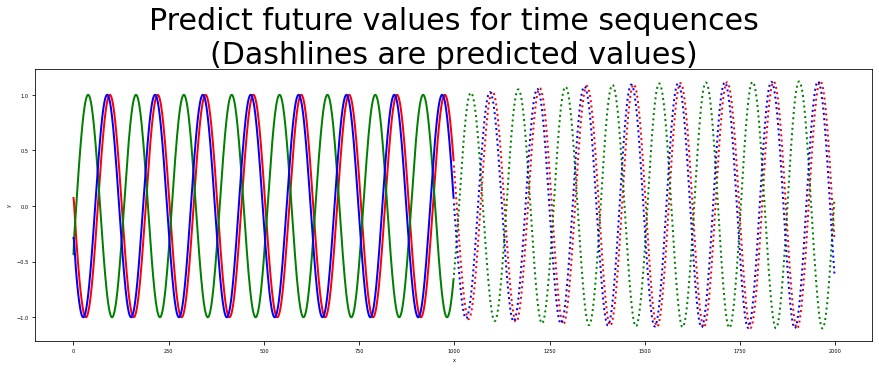

STEP:  12
loss: 5.067930310963871e-06
test loss: 7.288081235795972e-06


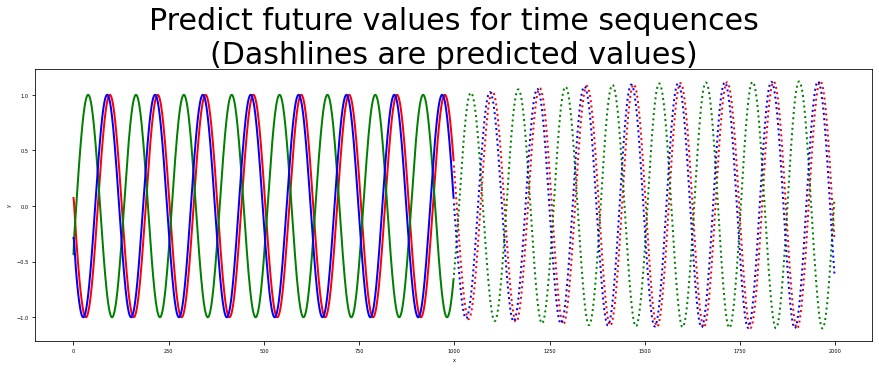

STEP:  13
loss: 5.067930310963871e-06
test loss: 7.288081235795972e-06


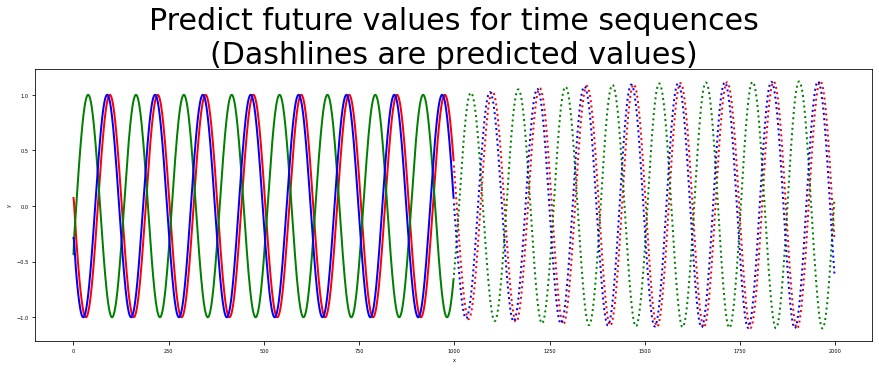

STEP:  14
loss: 5.067930310963871e-06
test loss: 7.288081235795972e-06


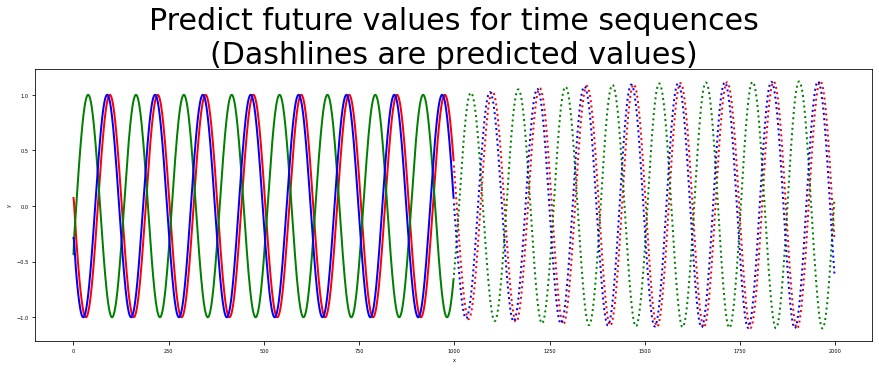

In [11]:
#main function
# LBFGS & StackedLSTM
future = 1000

# optimizer_type = 'Adam' #'Adam or 'LBFGS'
optimizer_type = 'LBFGS' #'Adam or 'LBFGS'

device = 'cuda' #'cuda


# Read more about 'LBFGS' Function https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html
# limited-memory Broyden Fletcher Goldfarb Shannon (L-BFGS)

# Read the following paper to see LBFGS in action for speech recognition application:
# https://ieeexplore.ieee.org/abstract/document/8461550

#model type
# seq = SequenceRNN(device = device)
# seq = SequenceLSTM(device = device)
seq = SequenceLSTMstack(device = device)

seq.double()
criterion = nn.MSELoss()

train_model(steps = 250 if optimizer_type == 'Adam' else 15, \
            seq = seq, \
            input = input, \
            target = target, \
            test_input = test_input, \
            test_target = test_target, \
            criterion = criterion, \
            optimizer_type = optimizer_type,\
            device = device)

# Runtime, Complexity and Difference

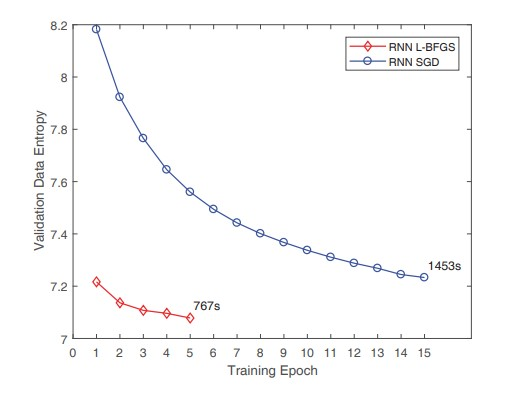

## References

[1] [RNN Intro](http://www.wildml.com/2015/09/recurrent-neural-networks-tutorial-part-1-introduction-to-rnns/) \\
[2] [LSTM Intro](https://colah.github.io/posts/2015-08-Understanding-LSTMs/) \\
[3] [Sine wave problem](https://github.com/pytorch/examples/tree/master/time_sequence_prediction) \\